In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
import os
print(os.getcwd())

C:\Users\Cheng\OneDrive\Documents\Proj\VarianceArithmetic\IPyNb


In [3]:
df = pd.read_csv("../Cpp/Output/FFT_2_19.txt", sep='\t')
df.head()

,SinSource,NoiseType,Noise,Signal,Order,Freq,Test,Uncertainty Count,Uncertainty Mean,Uncertainty Deviation,...,1.2,1.4,1.6,1.8,2,2.2,2.4,2.6,2.8,3
0,Prec,Gaussian,0.0,Sin,2,1,Forward,8,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Prec,Gaussian,0.0,Sin,2,1,Reverse,8,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Prec,Gaussian,0.0,Sin,2,1,Roundtrip,8,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Prec,Gaussian,0.0,Cos,2,1,Forward,8,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Prec,Gaussian,0.0,Cos,2,1,Reverse,8,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
df.columns

Index(['SinSource', 'NoiseType', 'Noise', 'Signal', 'Order', 'Freq', 'Test',
       'Uncertainty Count', 'Uncertainty Mean', 'Uncertainty Deviation',
       'Uncertainty Minimum', 'Uncertainty Minimum At', 'Uncertainty Maximum',
       'Uncertainty Maximum At', 'Value Count', 'Value Mean',
       'Value Deviation', 'Value Minimum', 'Value Minimum At', 'Value Maximum',
       'Value Maximum At', 'Error Count', 'Error Mean', 'Error Deviation',
       'Error Minimum', 'Error Minimum At', 'Error Maximum',
       'Error Maximum At', 'Lower Count', 'Upper Count', '-3', '-2.8', '-2.6',
       '-2.4', '-2.2', '-2', '-1.8', '-1.6', '-1.4', '-1.2', '-1', '-0.8',
       '-0.6', '-0.4', '-0.2', '0', '0.2', '0.4', '0.6', '0.8', '1', '1.2',
       '1.4', '1.6', '1.8', '2', '2.2', '2.4', '2.6', '2.8', '3'],
      dtype='object')

In [5]:
len(df)

62472

In [6]:
df[df.duplicated(subset=['SinSource', 'NoiseType', 'Noise', 'Signal', 'Order', 'Freq', 'Test'])]

,SinSource,NoiseType,Noise,Signal,Order,Freq,Test,Uncertainty Count,Uncertainty Mean,Uncertainty Deviation,...,1.2,1.4,1.6,1.8,2,2.2,2.4,2.6,2.8,3


In [7]:
df[(df['Order'] >= 6) & (df['Signal'] == 'Aggr') & (df.isna().any(axis=1))].head()

,SinSource,NoiseType,Noise,Signal,Order,Freq,Test,Uncertainty Count,Uncertainty Mean,Uncertainty Deviation,...,1.2,1.4,1.6,1.8,2,2.2,2.4,2.6,2.8,3


## Maiximal Normalized Errors

In [8]:
dfF = df[(df['SinSource']=='Lib') & (df['NoiseType']=='Gaussian') & (df['Noise']==0)
          & (df['Signal']=='Linear') & (df['Freq']==0) & (df['Test']=='Reverse')]
dfF[['Noise',
     'Error Count', 'Error Mean', 'Error Deviation', 'Error Minimum', 'Error Minimum At', 'Error Maximum', 'Error Maximum At']]

,Noise,Error Count,Error Mean,Error Deviation,Error Minimum,Error Minimum At,Error Maximum,Error Maximum At
463,0.0,4,-0.275758,1.663752,-2.551520,1.0,1.448490,5.0
1615,0.0,14,0.268639,2.825714,-3.819865,1.0,3.654550,13.0
3919,0.0,30,0.252958,7.001859,-10.400989,1.0,9.724355,8.0
6655,0.0,62,0.263933,7.723624,-15.326215,3.0,11.974097,47.0
9391,0.0,126,0.076455,5.742550,-11.458879,61.0,12.828642,111.0
12127,0.0,254,0.118323,6.949695,-17.090047,238.0,14.860773,94.0
14863,0.0,510,0.175774,18.541544,-36.881328,1.0,31.734265,96.0
17599,0.0,1022,0.207322,140.179275,-257.672304,17.0,229.234180,529.0
20335,0.0,2046,2.090979,73.503893,-163.838238,1.0,215.859942,1537.0
23071,0.0,4094,-0.244213,458.648694,-862.802144,65.0,785.364669,2305.0


# Special Order

In [9]:
ORDER=18

# vs Noise vs Order

In [10]:
def PlotSurface(test, value, noiseType, sinSource, signal, freq=0, logz=False, cmap=plt.cm.gray, 
                minNoise=1e-15, minOrder=2):
    dfOrderVsNoise = df[(df['Noise']>=minNoise) & (df['NoiseType']==noiseType) & 
                        (df['Order']>=minOrder) & (df['Order']<=ORDER) & 
                        (df['SinSource']==sinSource) & (df['Signal']==signal) & (df['Test']==test) & (df['Freq']==freq)]\
                .pivot(index='Noise', columns='Order', values=value)
    sOrder = dfOrderVsNoise.columns.values
    sNoise = dfOrderVsNoise.index.values
    sX, sY = np.meshgrid(sOrder, sNoise)
    sY = np.log10(sY)
    sZ = np.log10(dfOrderVsNoise.values) if logz else dfOrderVsNoise.values
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(30, 135)
    surf = ax.plot_surface( sX, sY, sZ, cmap=cmap if cmap else plt.cm.spring if value == 'Uncertainty Mean' else plt.cm.winter )
    cb = fig.colorbar(surf, shrink=0.5, aspect=5, pad=0.15)
    
    signalName = 'Sin/Cos' if signal=='Aggr' else signal if signal in ['Linear', 'Slope'] else f'{signal} freq={freq}'
    ax.set_title(f'{signalName} {test} using {sinSource}')
    
    ax.set_xlabel('Order')
    sXTick = [sOrder[i] for i in range(0, len(sOrder), 2)]
    ax.set_xticks(sXTick, [f'{x}' for x in sXTick])
    
    ax.set_ylabel('Input Noise')
    sYTick = [sNoise[i] for i in range(0, len(sNoise), 3)]
    ax.set_yticks(np.log10(sYTick), [f'{y:.1e}' for y in sYTick])
    
    ax.set_zlabel(value)
    if value == 'Error Deviation':
        pass
        # TODO: adjust color range 
        # ax.set_zlim([0, 2])
        # cb.set_clim([0, 2])
    if logz:
        zMin = int(math.floor(np.min(sZ)))
        zMax = int(math.ceil(np.max(sZ)))
        sZTick = range(zMin, zMax, int(math.ceil((zMax - zMin)/10)))
        ax.set_zticks(sZTick, [f'1e{z:+}' for z in sZTick])

## Sin/Cos

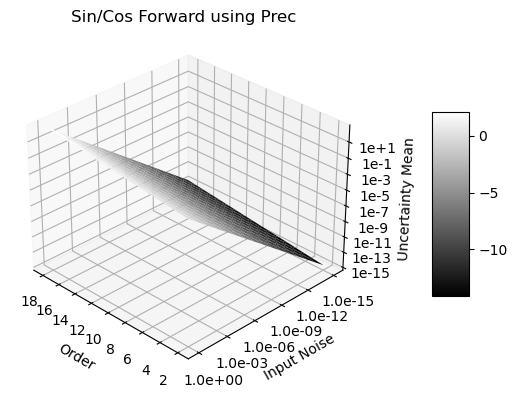

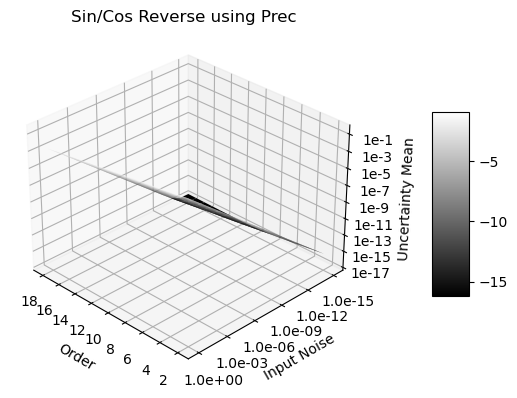

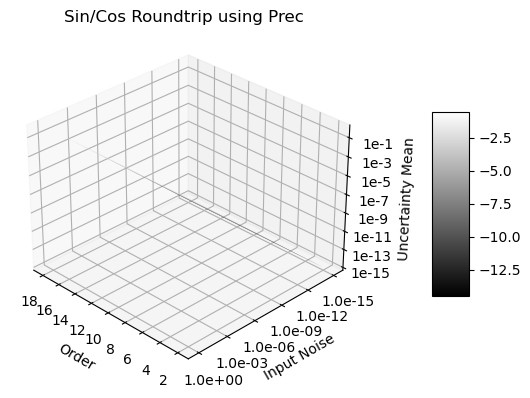

In [11]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Uncertainty Mean', 'Gaussian', 'Prec', 'Aggr', logz=True)

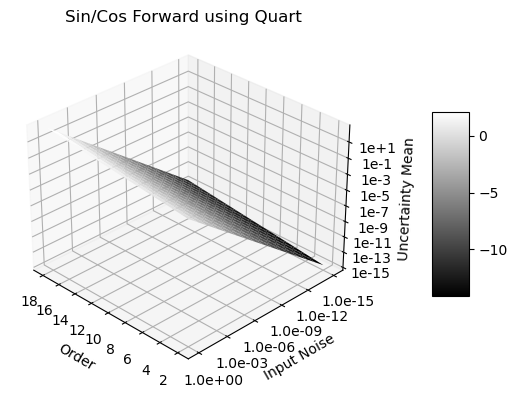

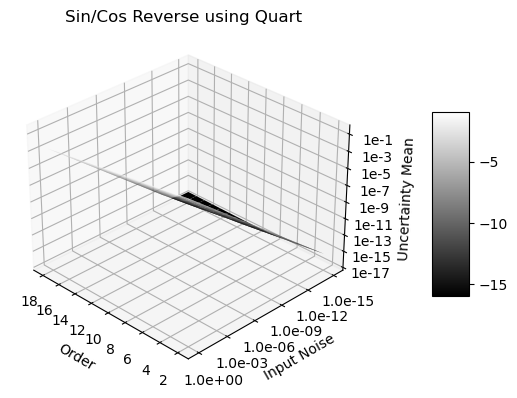

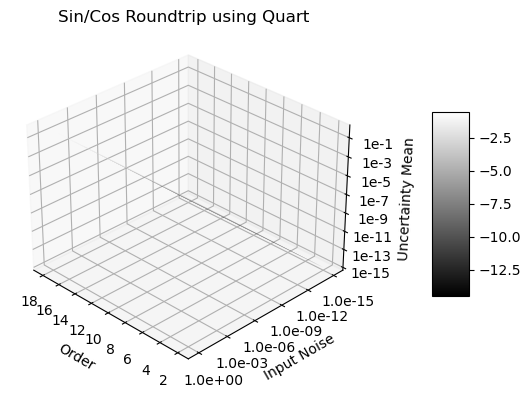

In [12]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Uncertainty Mean', 'Gaussian', 'Quart', 'Aggr', logz=True)

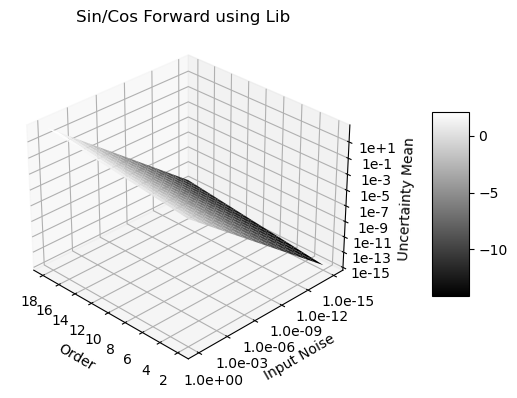

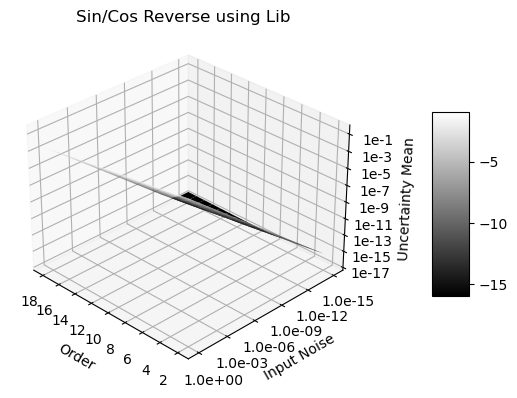

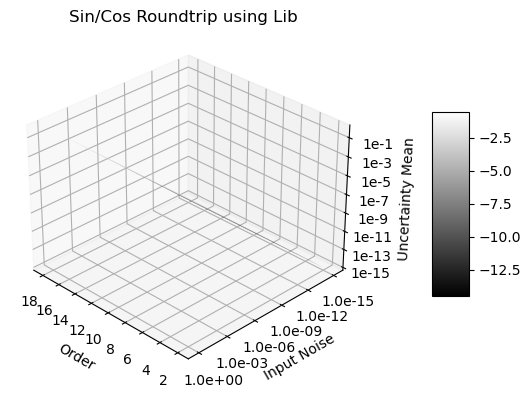

In [13]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Uncertainty Mean', 'Gaussian', 'Lib', 'Aggr', logz=True)

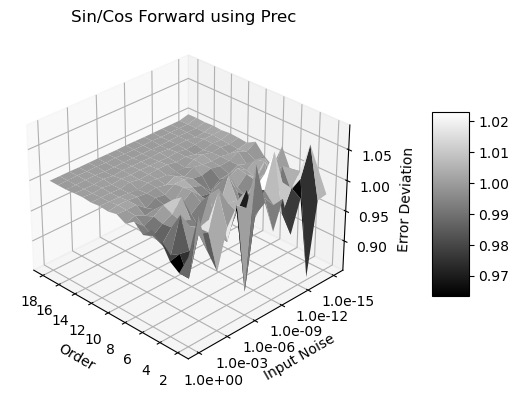

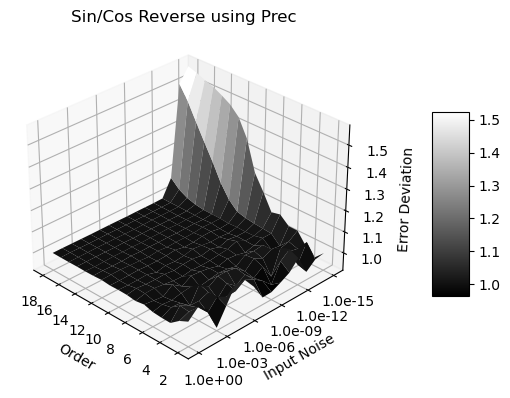

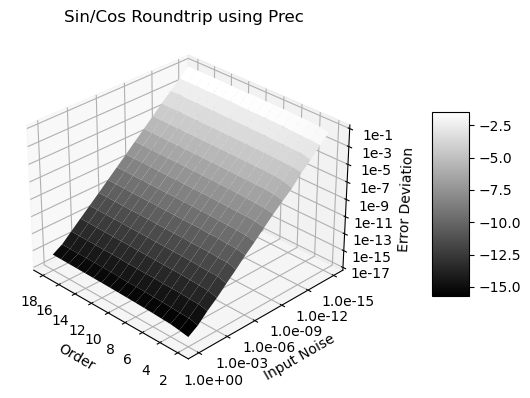

In [14]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Error Deviation', 'Gaussian', 'Prec', 'Aggr', logz=(test=='Roundtrip'))

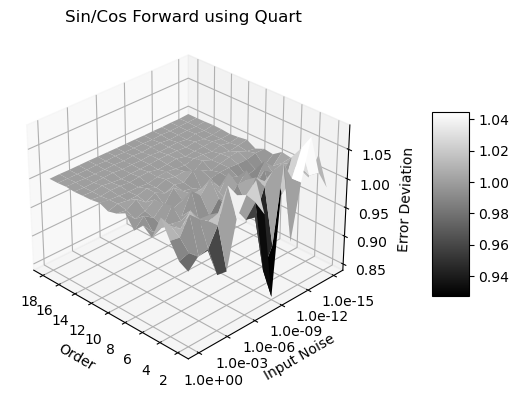

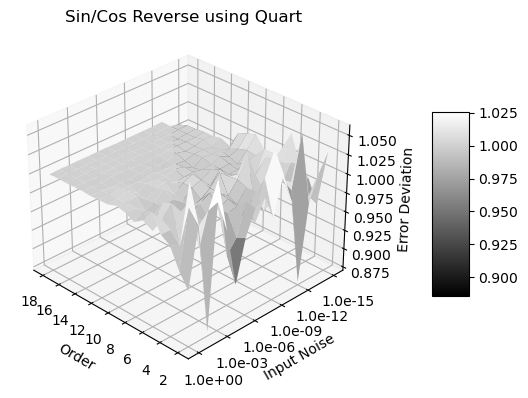

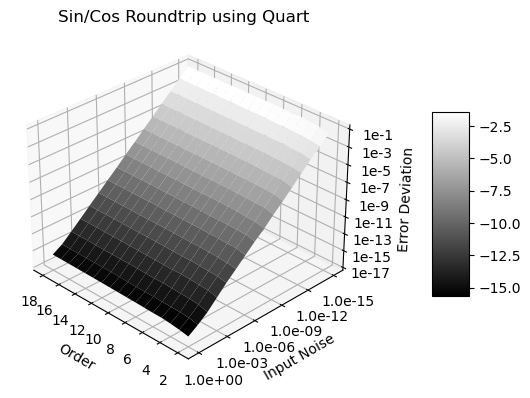

In [15]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Error Deviation', 'Gaussian', 'Quart', 'Aggr', logz=(test=='Roundtrip'))

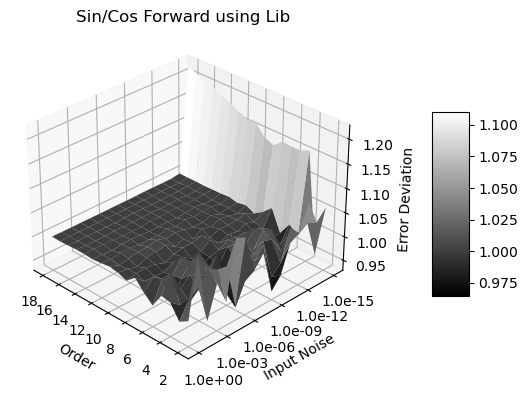

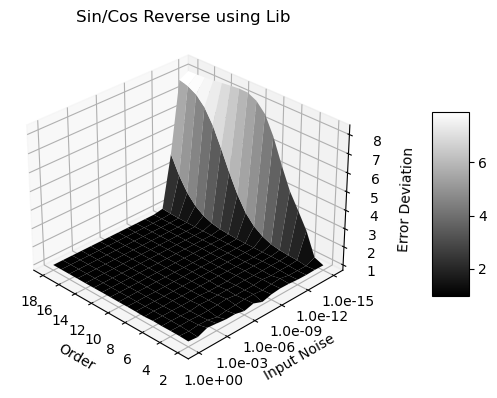

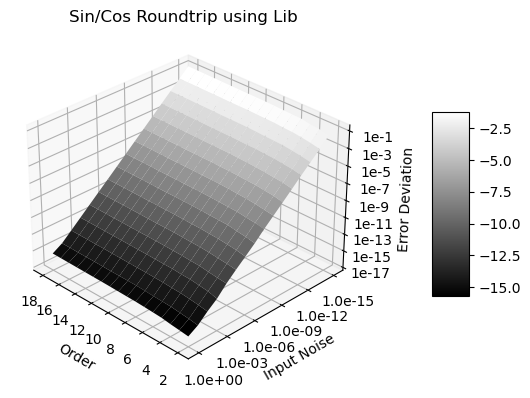

In [16]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Error Deviation', 'Gaussian', 'Lib', 'Aggr', logz=(test=='Roundtrip'))

## Linear

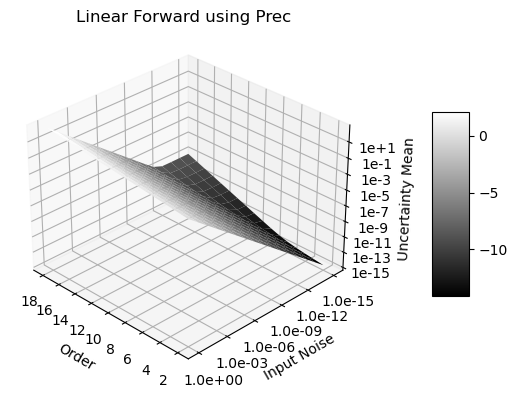

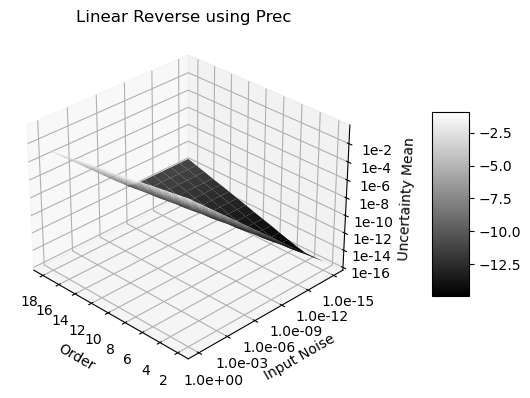

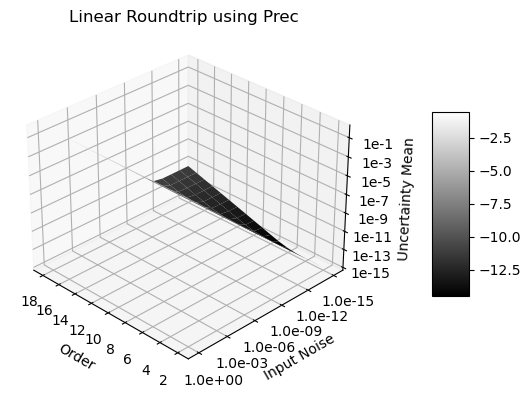

In [17]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Uncertainty Mean', 'Gaussian', 'Prec', 'Linear', logz=True)

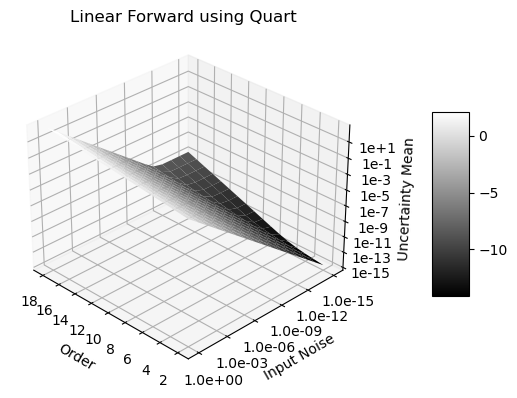

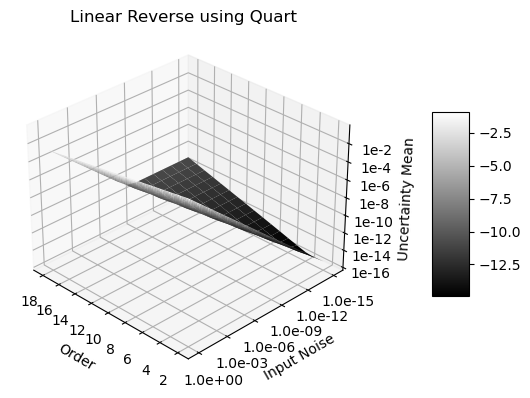

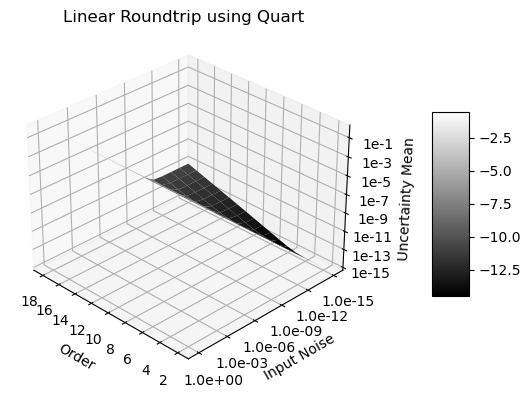

In [18]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Uncertainty Mean', 'Gaussian', 'Quart', 'Linear', logz=True)

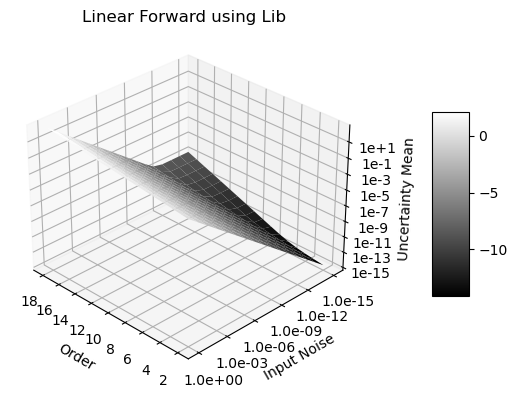

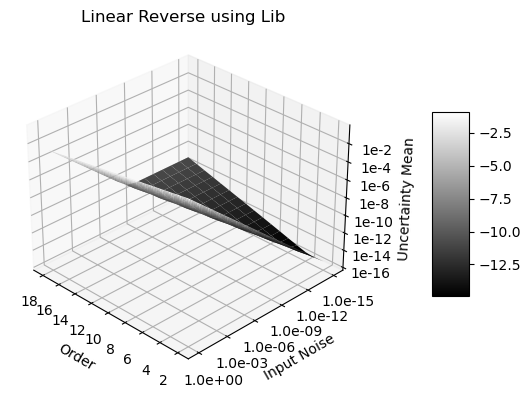

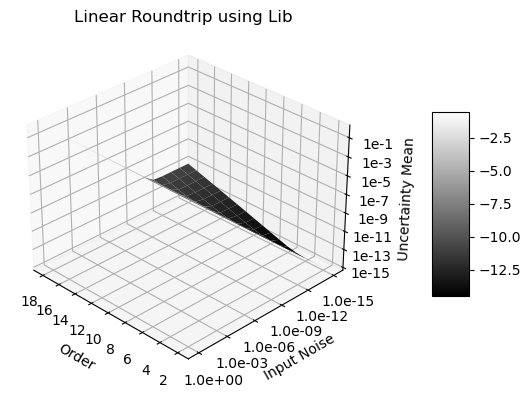

In [19]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Uncertainty Mean', 'Gaussian', 'Lib', 'Linear', logz=True)

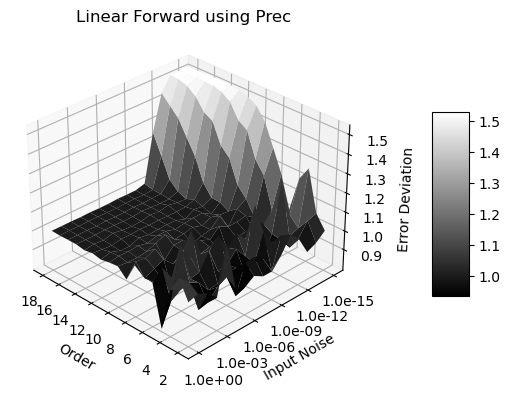

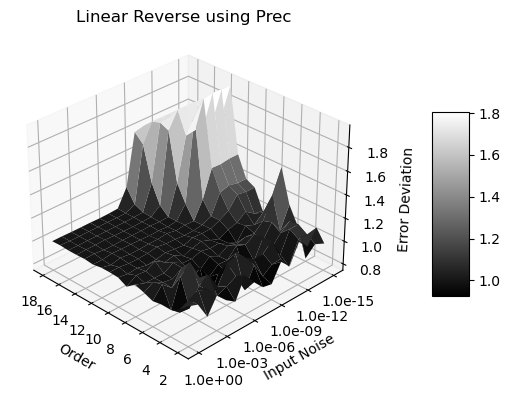

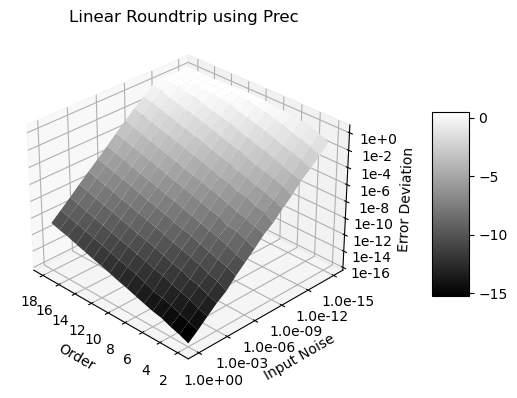

In [20]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Error Deviation', 'Gaussian', 'Prec', 'Linear', logz=(test=='Roundtrip'))

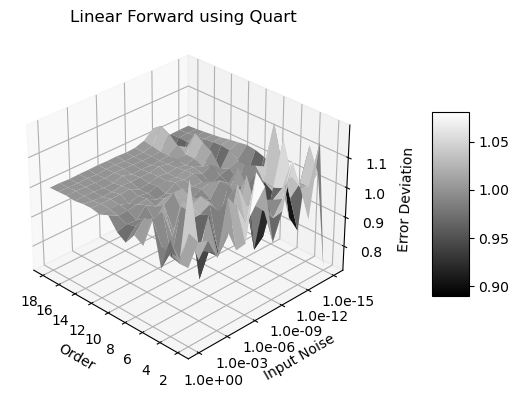

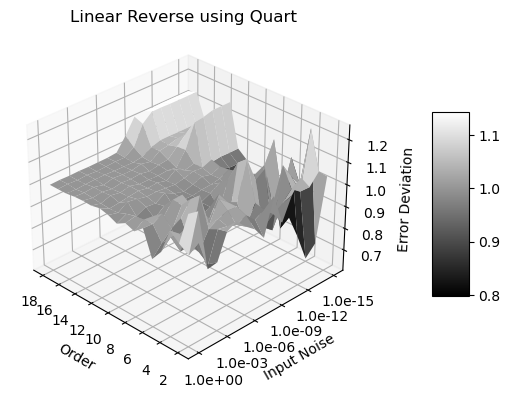

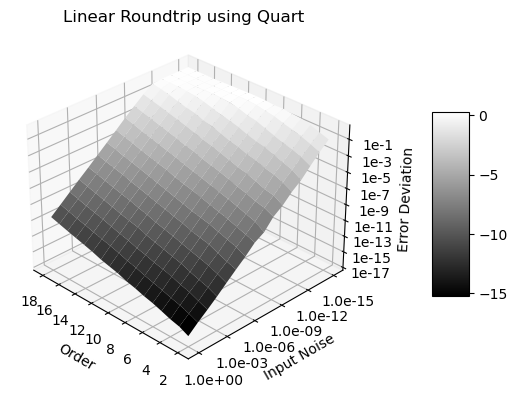

In [21]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Error Deviation', 'Gaussian', 'Quart', 'Linear', logz=(test=='Roundtrip'))

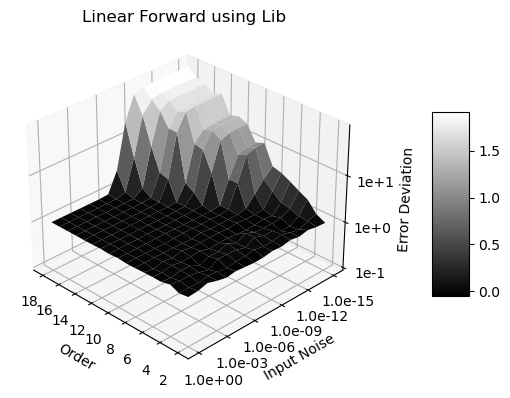

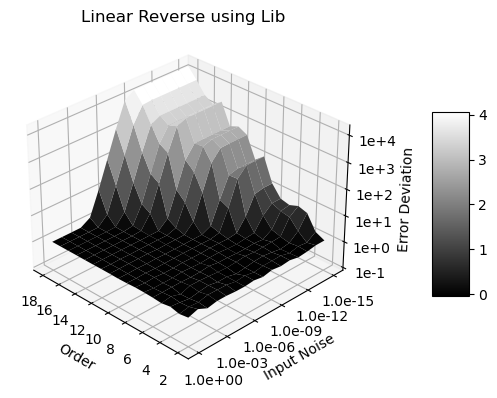

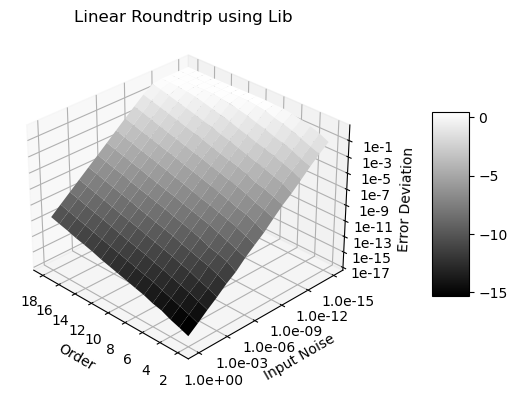

In [22]:
for test in ['Forward', 'Reverse', 'Roundtrip']:
    PlotSurface(test, 'Error Deviation', 'Gaussian', 'Lib', 'Linear', logz=True)

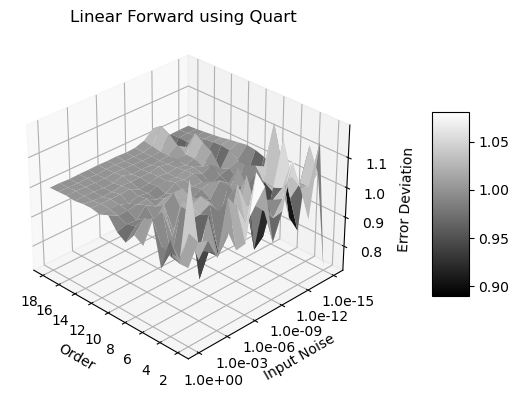

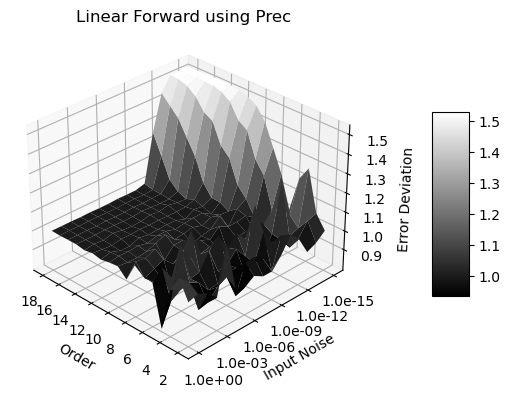

In [23]:
for lib in ['Quart', 'Prec']:
    PlotSurface('Forward', 'Error Deviation', 'Gaussian', lib, 'Linear')

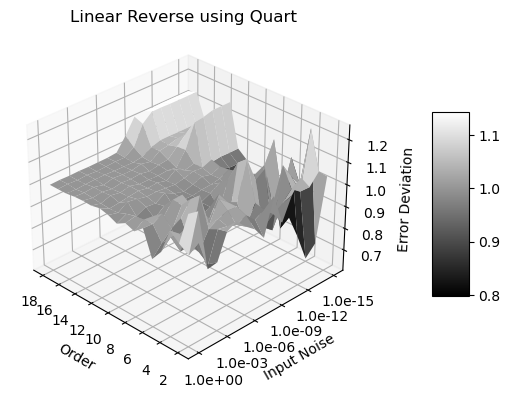

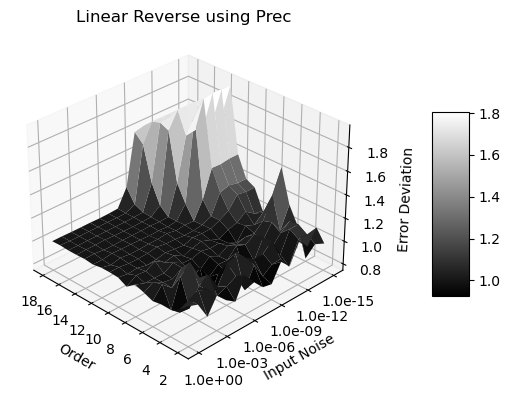

In [24]:
for lib in ['Quart', 'Prec']:
    PlotSurface('Reverse', 'Error Deviation', 'Gaussian', lib, 'Linear')

# Different Frequency

## When Noise=0

In [25]:
def PlotErrorDev(sinSource, test, noise, noiseType='Gaussian', signal='Sin', minOrder=6):
    dfPlot = df[(df['SinSource']==sinSource) & (df['NoiseType']==noiseType) & (df['Noise']==noise) & 
                (df['Signal']==signal) & (df['Test']=='Forward')]
    fig, ax = plt.subplots()
    ax.set_title(f'{signal} {test} using {sinSource}')
    ax.set_xlabel('Freq')
    ax.set_ylabel('Error Deviation')
    plt.grid(True)
    for order in range(minOrder, ORDER + 1):
        ax.plot(dfPlot[dfPlot['Order']==order]['Freq'], dfPlot[dfPlot['Order']==order]['Error Deviation'], label=f'{order}')
    ax.legend(bbox_to_anchor=(1.0, 1.0))

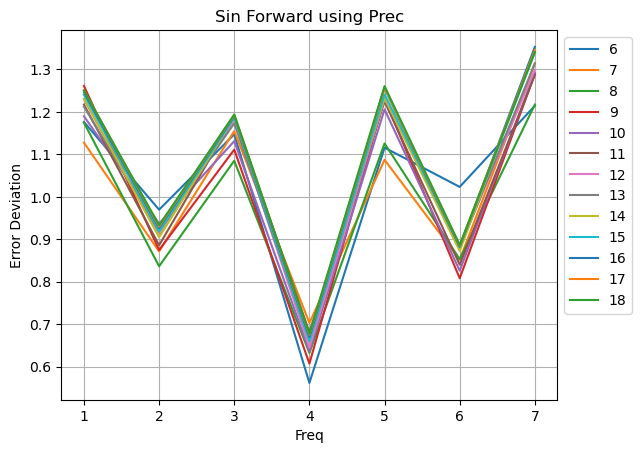

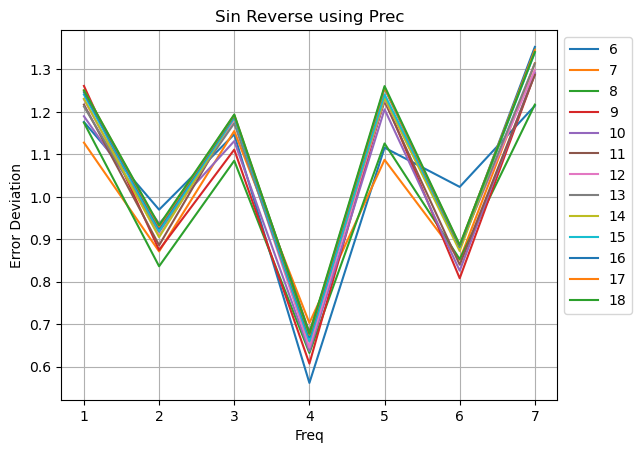

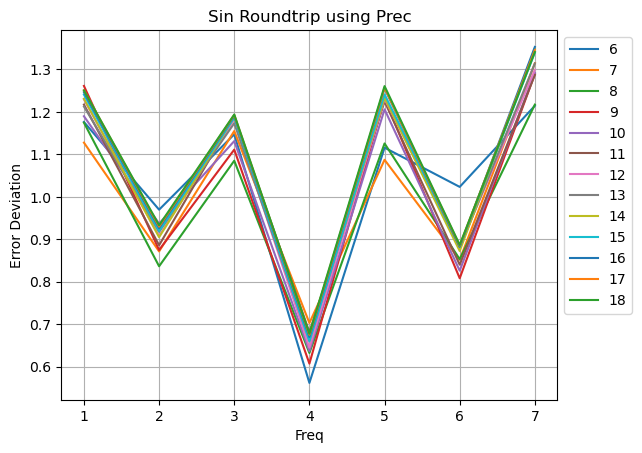

In [26]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotErrorDev('Prec', test, 0)

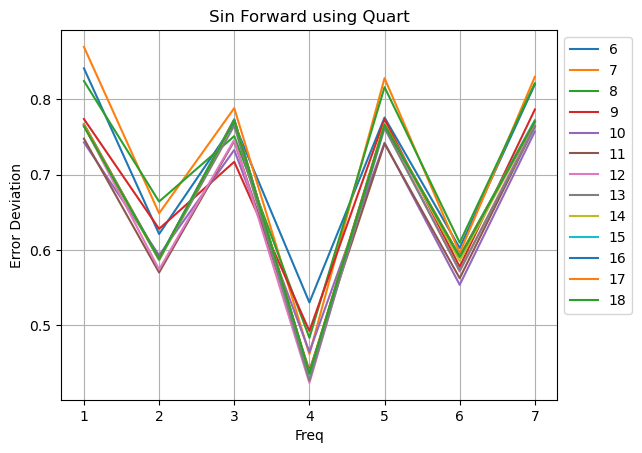

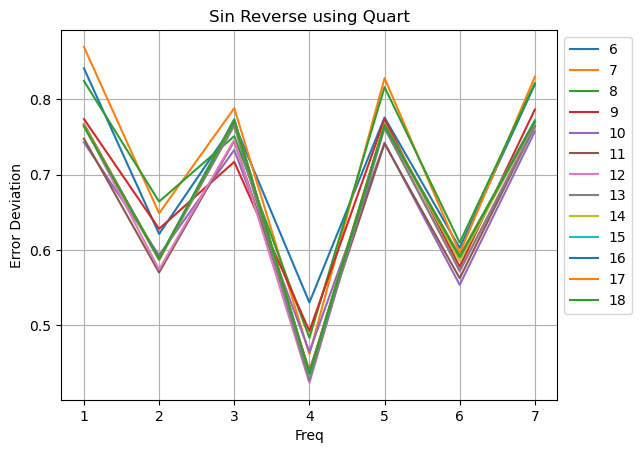

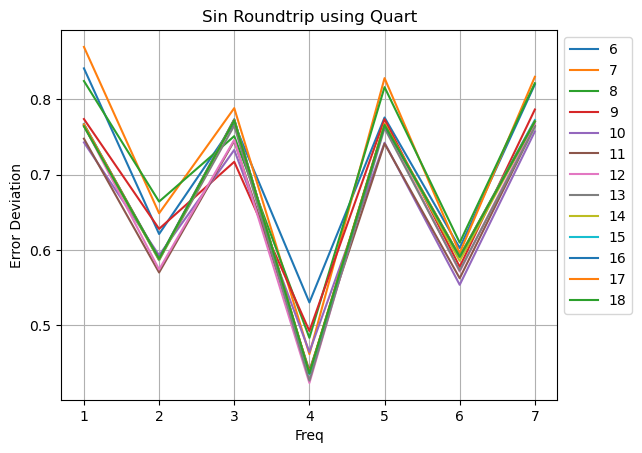

In [27]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotErrorDev('Quart', test, 0)

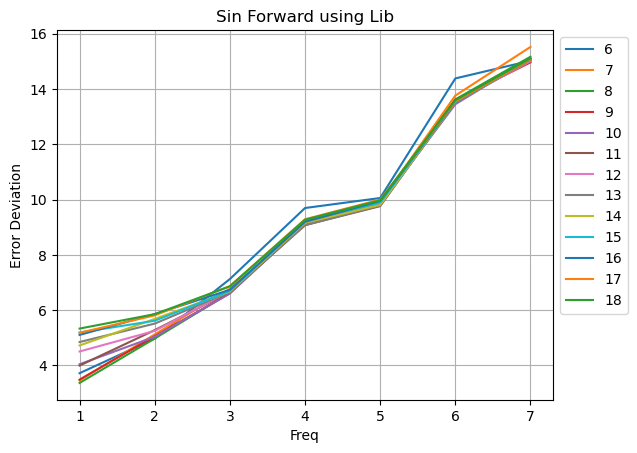

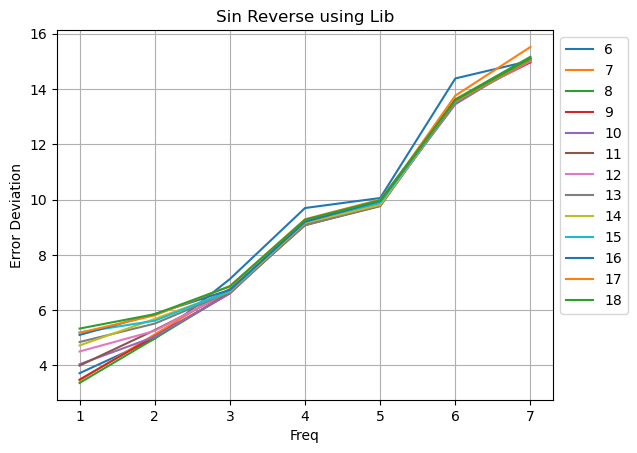

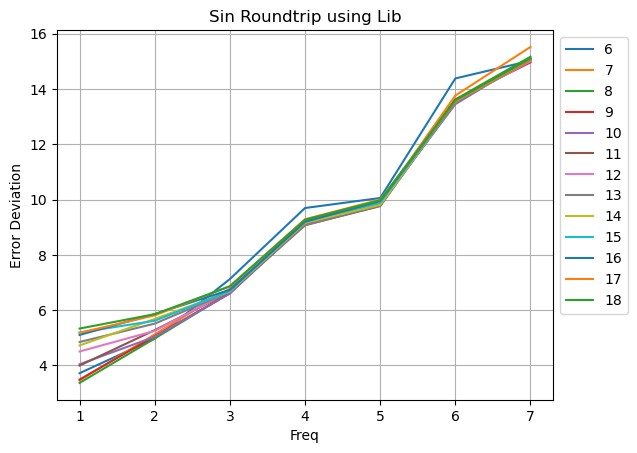

In [28]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotErrorDev('Lib', test, 0)

# Histogram

In [29]:
df.columns

Index(['SinSource', 'NoiseType', 'Noise', 'Signal', 'Order', 'Freq', 'Test',
       'Uncertainty Count', 'Uncertainty Mean', 'Uncertainty Deviation',
       'Uncertainty Minimum', 'Uncertainty Minimum At', 'Uncertainty Maximum',
       'Uncertainty Maximum At', 'Value Count', 'Value Mean',
       'Value Deviation', 'Value Minimum', 'Value Minimum At', 'Value Maximum',
       'Value Maximum At', 'Error Count', 'Error Mean', 'Error Deviation',
       'Error Minimum', 'Error Minimum At', 'Error Maximum',
       'Error Maximum At', 'Lower Count', 'Upper Count', '-3', '-2.8', '-2.6',
       '-2.4', '-2.2', '-2', '-1.8', '-1.6', '-1.4', '-1.2', '-1', '-0.8',
       '-0.6', '-0.4', '-0.2', '0', '0.2', '0.4', '0.6', '0.8', '1', '1.2',
       '1.4', '1.6', '1.8', '2', '2.2', '2.4', '2.6', '2.8', '3'],
      dtype='object')

In [30]:
sHisto = [str(v/10) if (v % 10) else str(v//10) for v in range(-30, 31, 2)]
print(sHisto)

['-3', '-2.8', '-2.6', '-2.4', '-2.2', '-2', '-1.8', '-1.6', '-1.4', '-1.2', '-1', '-0.8', '-0.6', '-0.4', '-0.2', '0', '0.2', '0.4', '0.6', '0.8', '1', '1.2', '1.4', '1.6', '1.8', '2', '2.2', '2.4', '2.6', '2.8', '3']


In [31]:
df[sHisto].head()

,-3,-2.8,-2.6,-2.4,-2.2,-2,-1.8,-1.6,-1.4,-1.2,...,1.2,1.4,1.6,1.8,2,2.2,2.4,2.6,2.8,3
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Sin/Cos

## Sin at different Freq

In [32]:
def PlotManyFreq(test, sinSource, noise, signal='Sin', order=ORDER, sFreq=[1,2,3,4,5,6]):
    df['legend'] = df['NoiseType'] +' noise=' + df['Noise'].astype(str) + " freq="+ df['Freq'].astype(str)
    dfHisto = df[(df['Order']==order) & (df['Noise']<=noise*1.01) & (df['Noise']>=noise*0.99) & (df['Signal']==signal) & 
                 (df['Test']==test) & (df['SinSource']==sinSource) & (df['Freq'].isin(sFreq))].set_index('legend')
    ax = dfHisto[sHisto].T.plot( style=['-']*3 + ['--']*3 + ['x']*3 + ['+']*3, grid=True, logy=True,
                            title=f'{signal} {test} order={order} noise={noise} sinSource={sinSource}' )
    ax.legend(loc='upper right', bbox_to_anchor=(2, 1.0))

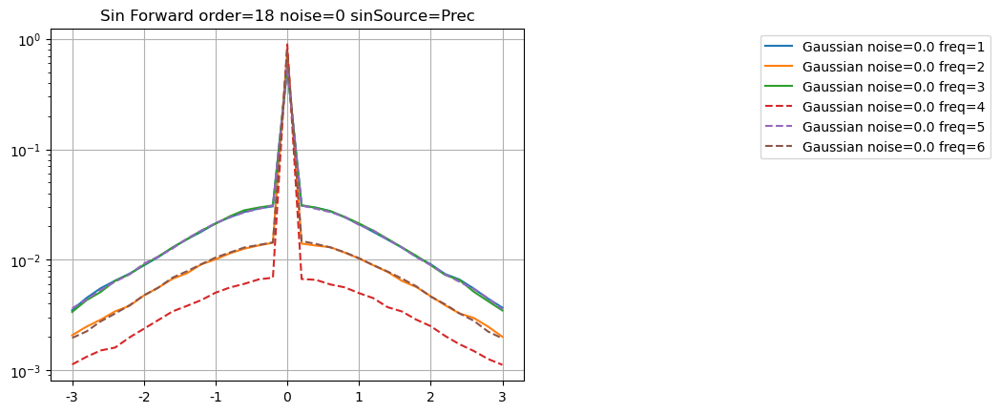

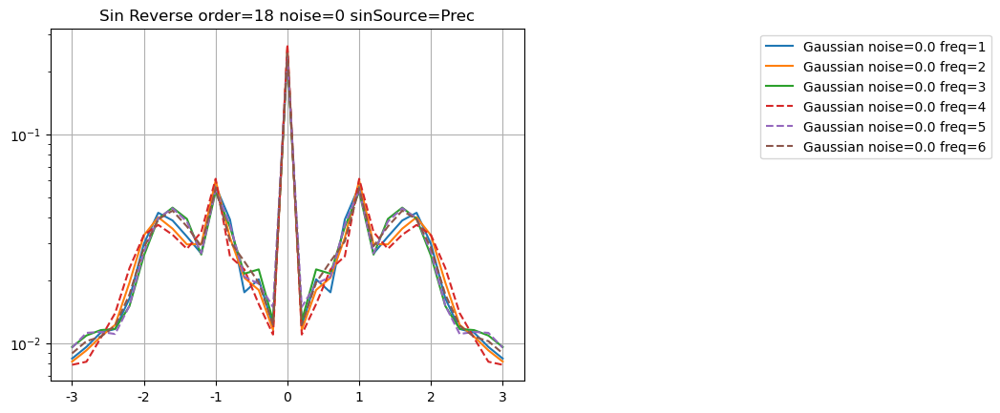

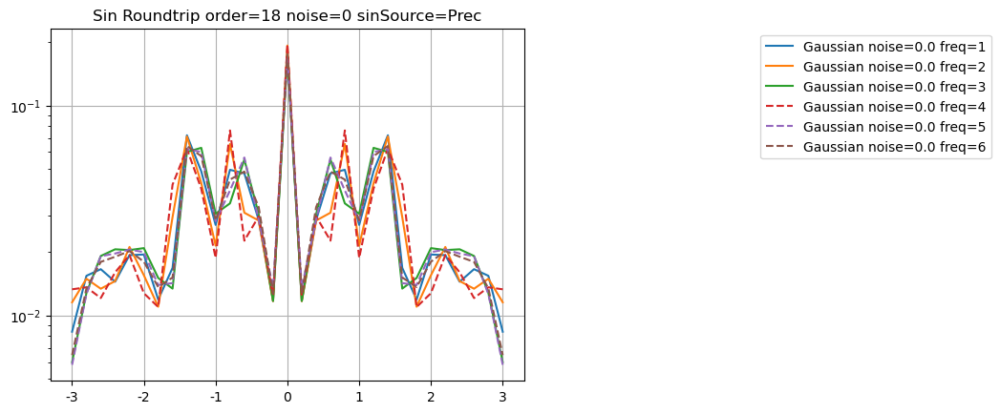

In [33]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotManyFreq(test, 'Prec', 0)

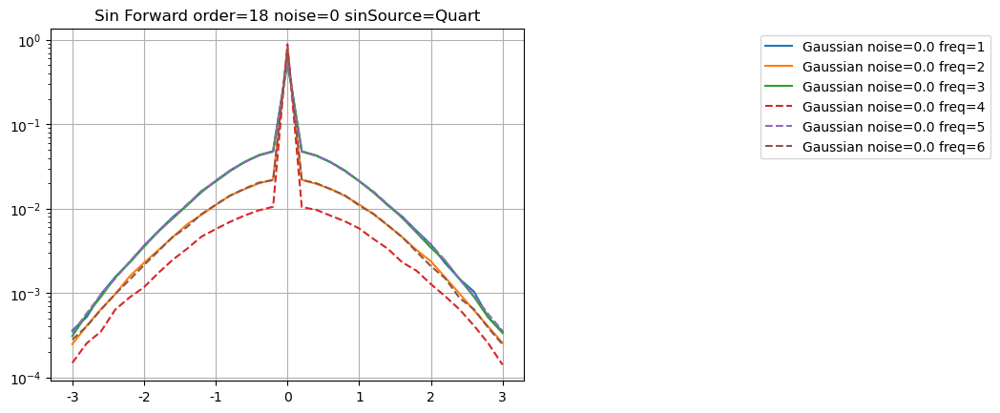

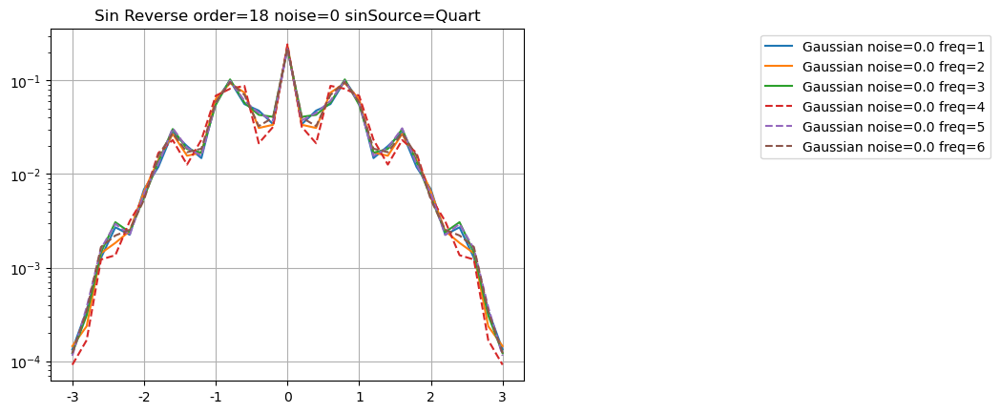

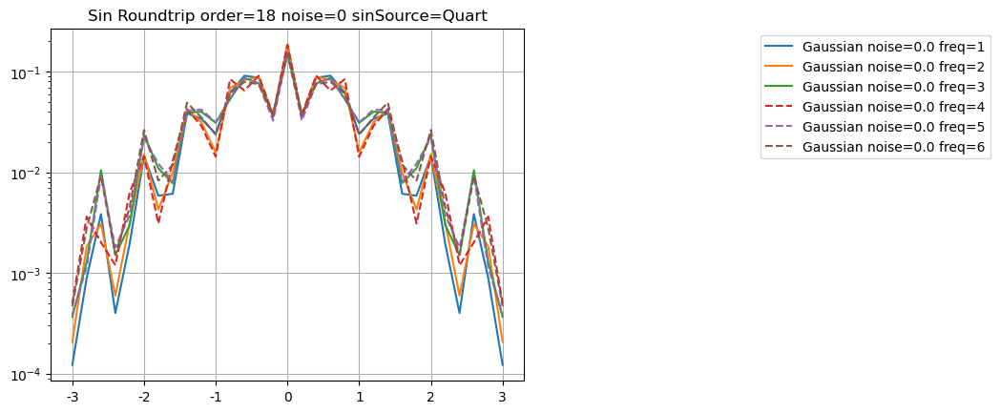

In [34]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotManyFreq(test, 'Quart', 0)

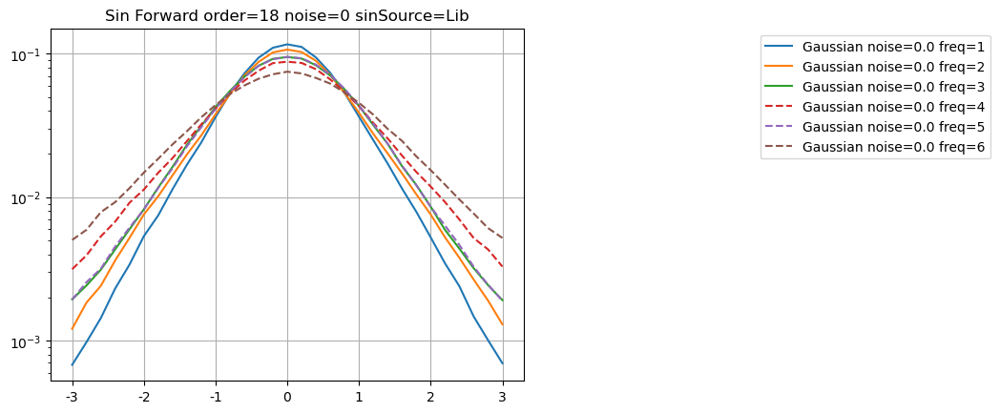

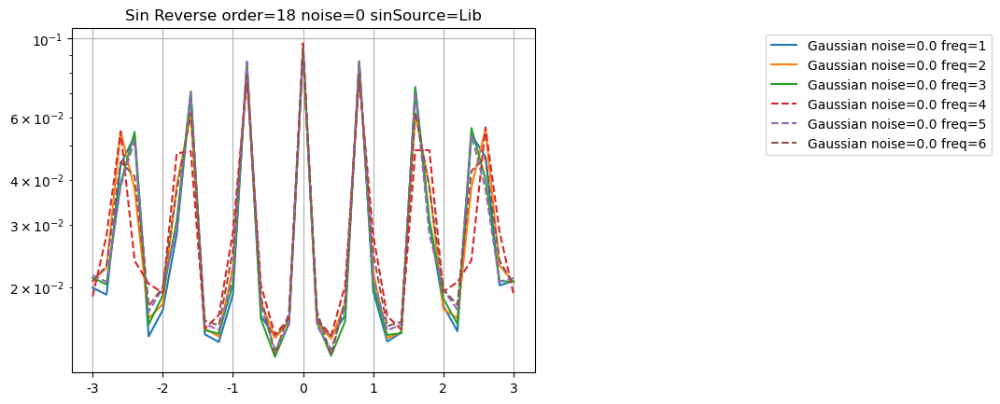

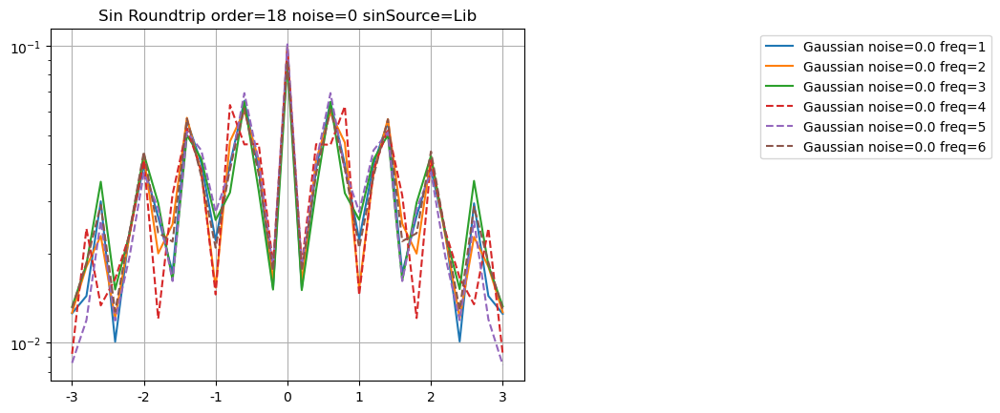

In [35]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotManyFreq(test, 'Lib', 0)

### Sin vs Cos

In [36]:
def PlotSinCos(test, sinSource, noise, order=ORDER, sFreq=(1,2,3,4)):
    df['legend'] = df['Signal'] + "("+ df['Freq'].astype(str) + ")"
    dfHisto = df[(df['NoiseType']=='Gaussian') & (df['Noise']<=noise*1.01) & (df['Noise']>=noise*0.99) & 
                 (df['Order']==order) & (df['Freq'].isin(sFreq)) & (df['Test']==test) & 
                 (df['SinSource']==sinSource) & (df['Signal'].isin(['Sin', 'Cos']))].set_index('legend')
    ax = dfHisto[sHisto].T.plot(style=['-', '--', ':', '-.', 'x', '+', 'o', 'v'], grid=True, logy=True,
                       title=f'Sin/Cos {test}/{sinSource} order={order} noise={noise}')
    ax.legend(loc='upper right', bbox_to_anchor=(2, 1.0))

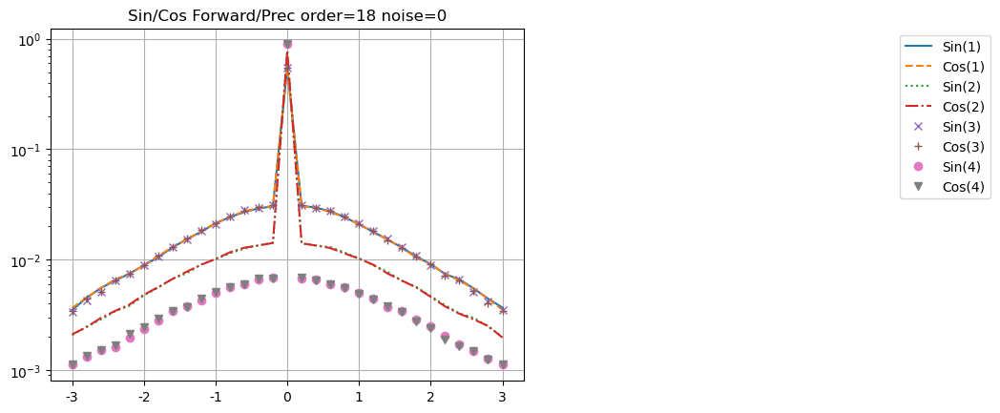

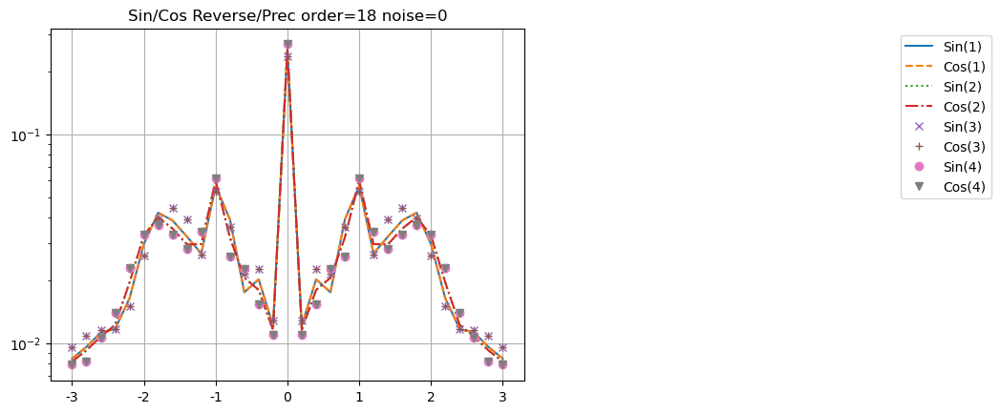

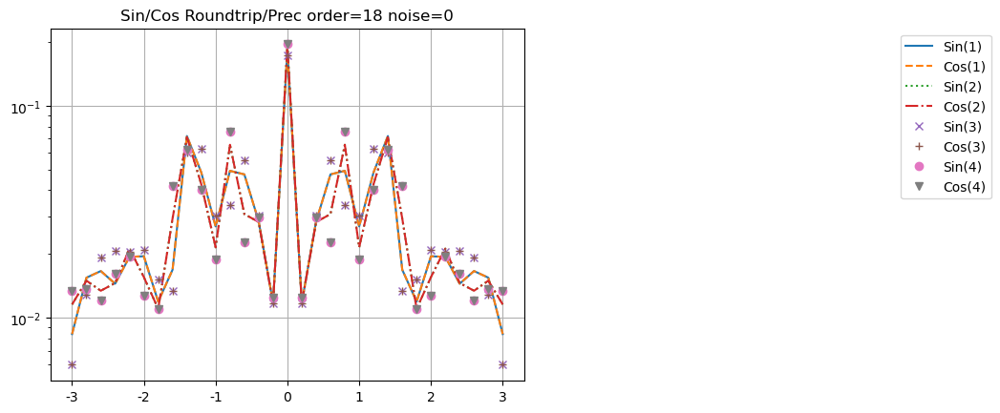

In [37]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotSinCos(test, 'Prec', 0)

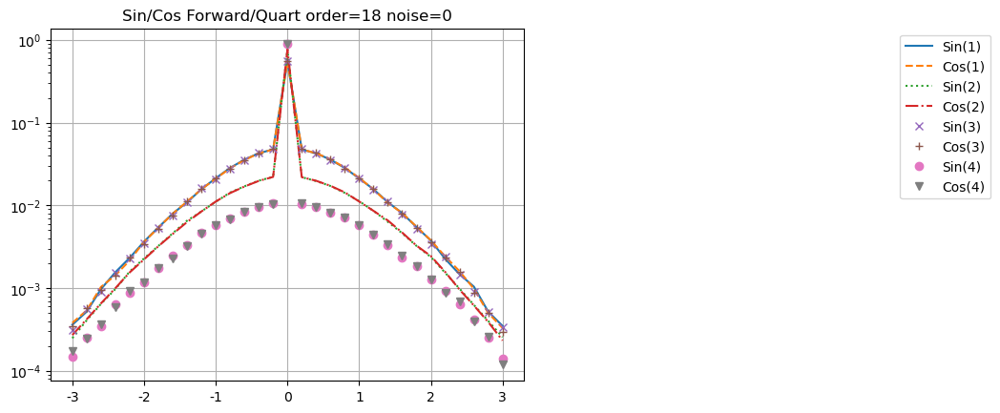

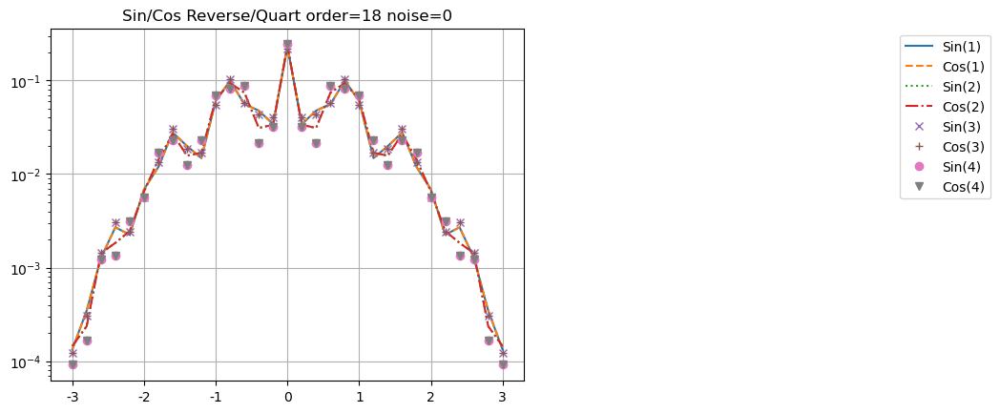

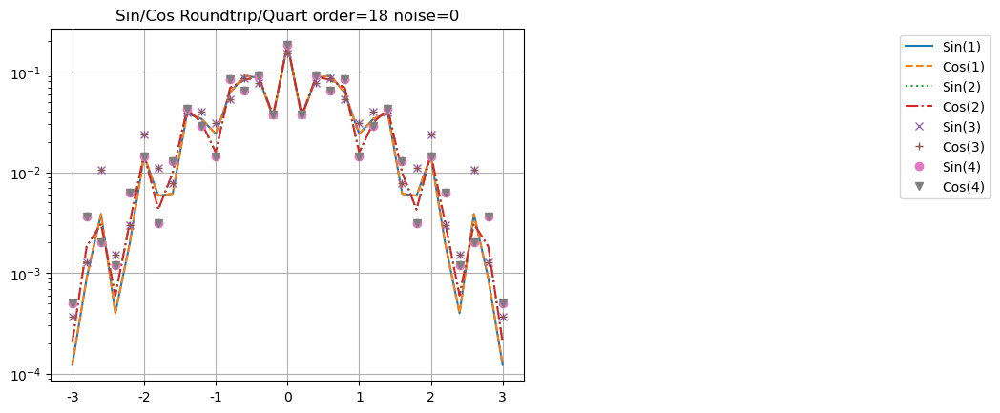

In [38]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotSinCos(test, 'Quart', 0)

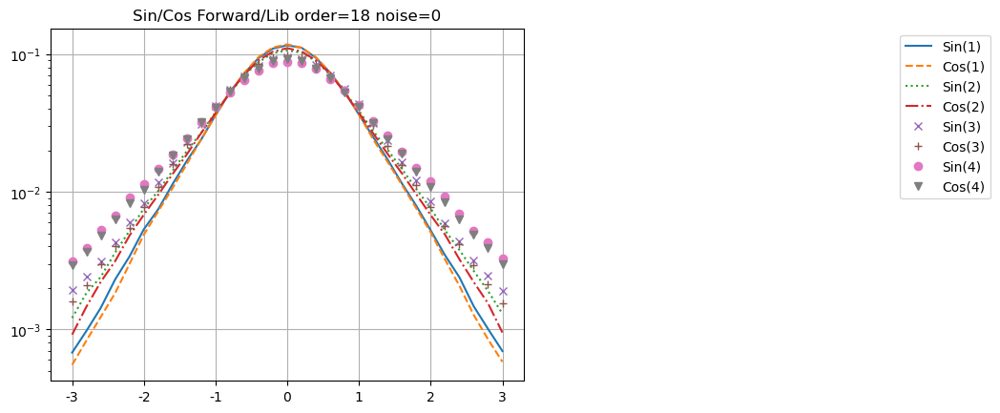

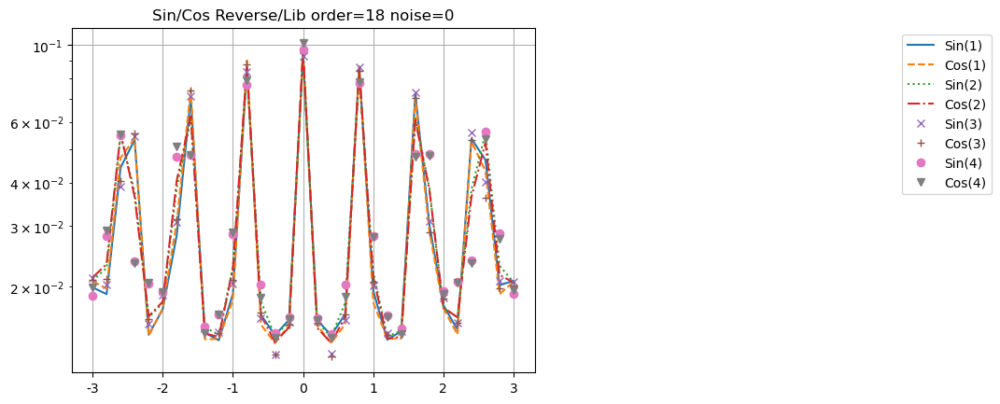

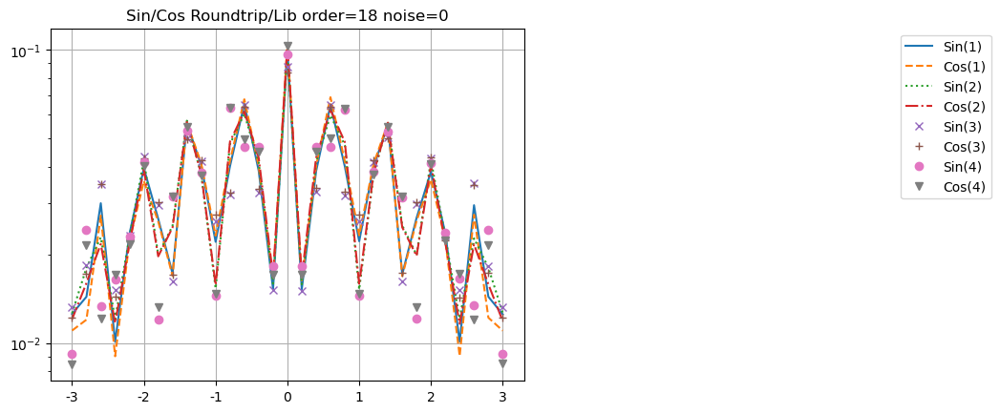

In [39]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    PlotSinCos(test, 'Lib', 0)

### Aggr vs Noise

In [40]:
def PlotHistogramClean( order, sinSource, signal, freq=0, ylim=[] ):
    signalName = 'Sin/Cos' if signal=='Aggr' else signal if signal=='Linear' else f'{signal} freq={freq}'
    df['legend'] = df['Test']

    dfHisto = df[(df['NoiseType']=='Gaussian') & (df['Noise']==0) & 
                 (df['Order']==order) & (df['SinSource']==sinSource) & (df['Signal']==signal) & (df['Freq']==freq)]\
                .set_index('legend')
    ax = dfHisto[sHisto].T.plot(style=['k-', 'k--', 'k:', 'k.', 'kx', 'k+'],
                           title=f'{signalName} order={order} using {sinSource}')
    ax.set_xlabel('Normalized Error')
    ax.set_ylabel('Normalized Histogram Count')
    ax.set_yscale('log')
    if ylim:
        ax.set_ylim(ylim)
    plt.grid(True)

In [41]:
def PlotHistogram( sinSource, noise, order, signal='Aggr', freq=0, ylim=[] ):
    if noise == 0:
        return PlotHistogramClean( order, sinSource, signal, freq, ylim )
    signalName = 'Sin/Cos' if signal=='Aggr' else signal if signal=='Linear' else f'{signal} freq={freq}'
    df['legend'] = df['Test'] + " " + df['NoiseType']

    dfHisto = df[(df['Order']==order) & (df['Noise']<=noise*1.01) & (df['Noise']>=noise*0.99) &  
                 (df['SinSource']==sinSource) & (df['Signal']==signal) & (df['Freq']==freq)].set_index('legend')
    ax = dfHisto[sHisto].T.plot(style=['k-', 'k--', 'k:', 'k.', 'kx', 'k+'],
                           title=f'{signalName} order={order} noise={noise:.0e} using {sinSource}')
    ax.set_xlabel('Normalized Error')
    ax.set_ylabel('Normalized Histogram Count')
    ax.set_yscale('log')
    if ylim:
        ax.set_ylim(ylim)
    plt.grid(True)

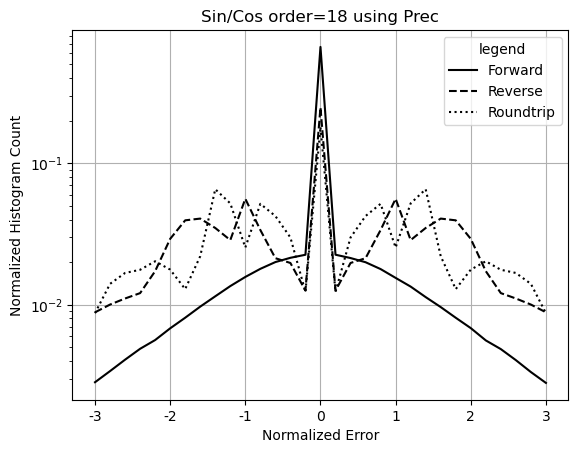

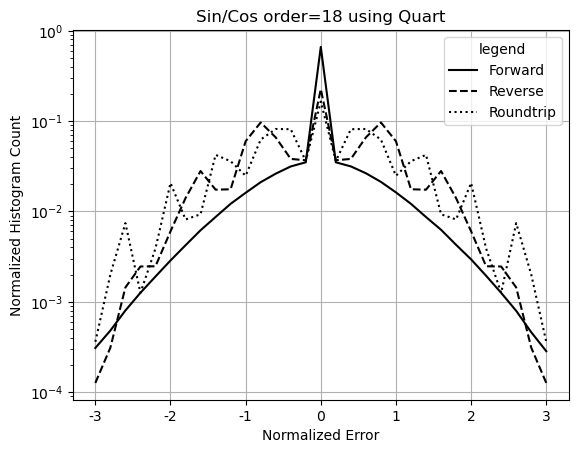

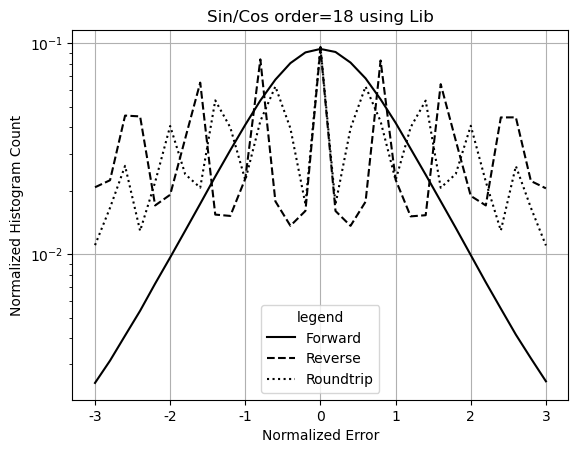

In [42]:
for sinSource in ('Prec', 'Quart', 'Lib'):
    PlotHistogram(sinSource, 0, ORDER)

### Linear vs Noise

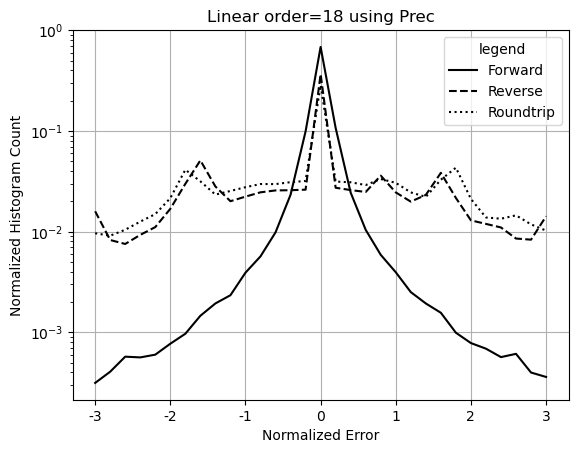

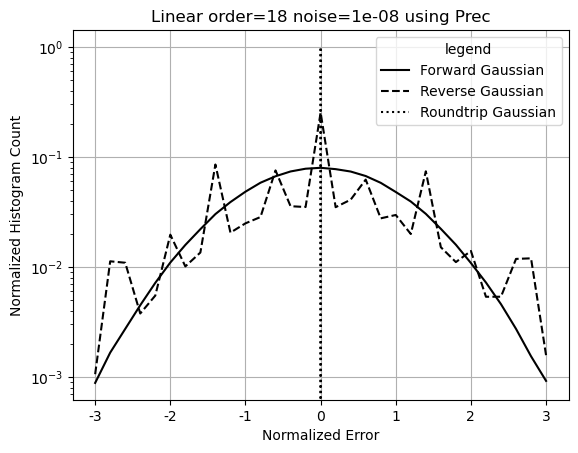

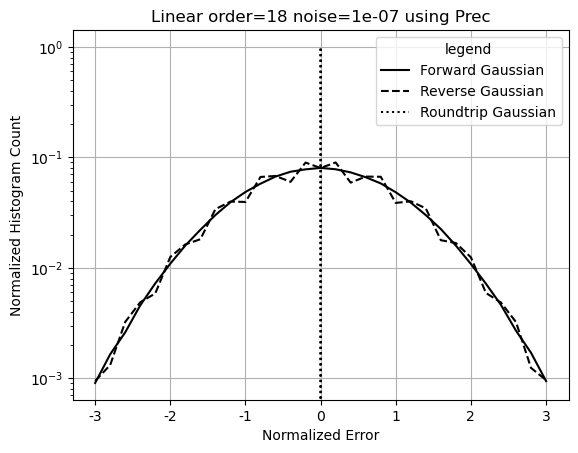

In [43]:
for noise in (0, 1e-8, 1e-7):
    PlotHistogram('Prec', noise, ORDER, signal='Linear')

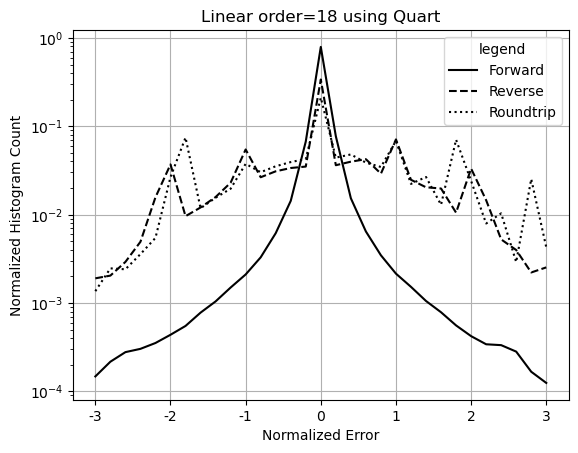

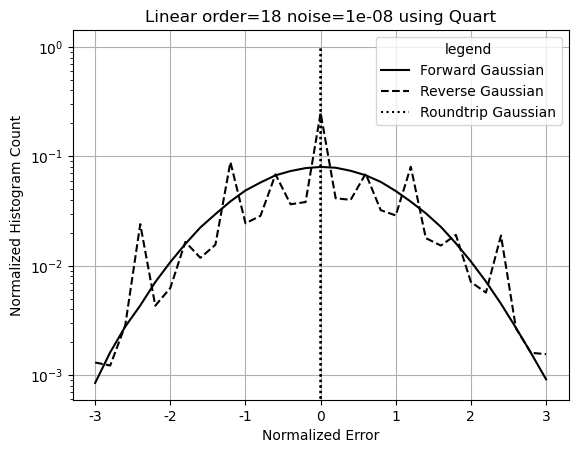

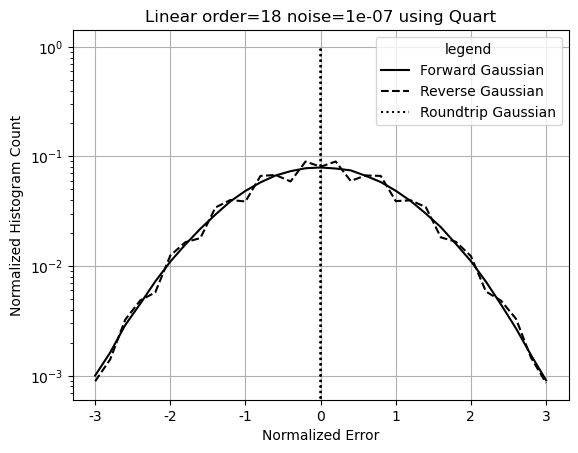

In [44]:
for noise in (0, 1e-8, 1e-7):
    PlotHistogram('Quart', noise, ORDER, signal='Linear')

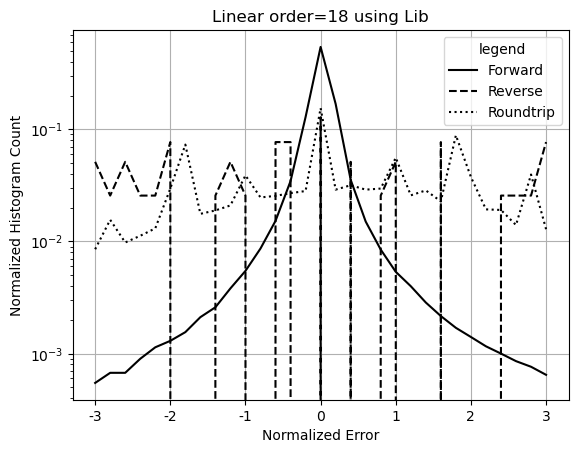

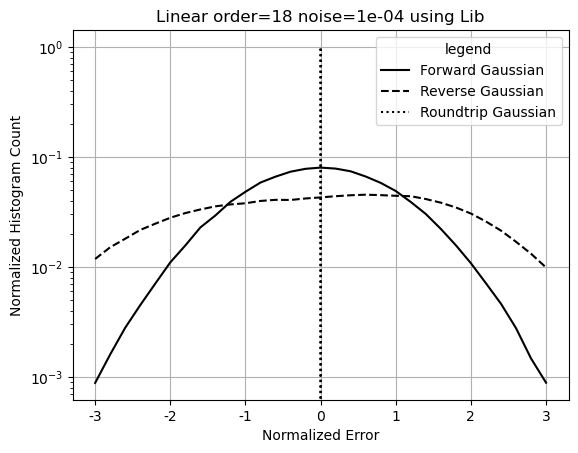

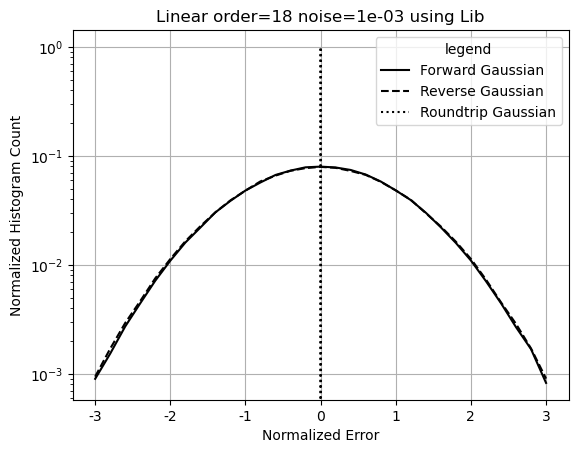

In [45]:
for noise in (0, 1e-4, 1e-3):
    PlotHistogram('Lib', noise, ORDER, signal='Linear')

# vs Order

In [46]:
def PlotVsOrder( sinSource, signal, freq=0, sTest=('Forward', 'Reverse', 'Roundtrip'), 
                 sValue=('Error Deviation', 'Uncertainty Mean'), 
                 sStyle=('-', '--', ':'), sLogy=(False, True), 
                 noiseType='Gaussian', noise=0 ):
    
    fig, ax = plt.subplots()
    signalName = 'Sin/Cos' if signal=='Aggr' else signal if signal=='Linear' else f'{signal} freq={freq}'
    ax.set_title(f'{signalName} without noise using {sinSource}' if noise==0 else f'{signalName} with {noise:.0e} noise using {sinSource}')
    ax.set_xticks(range(0, 19, 2))
    ax.set_xlabel('Order')
    ax.set_ylabel('Error Deviation')
    if sLogy[0]:
        ax.set_yscale('log')
    plt.grid(True)
    
    ax2 = ax.twinx()
    ax2.set_ylabel(sValue[1])
    if sLogy[1]:
        ax2.set_yscale('log')
    
    for test, style in zip(sTest, sStyle):
        dfPlot = df[(df['SinSource']==sinSource) & (df['Signal']==signal) & (df['Freq']==freq) & (df['Test']==test) &
                    (df['NoiseType']==noiseType) & (df['Noise']<=noise*1.01) & (df['Noise']>=noise*0.99)]
        if dfPlot.empty:
            continue
        ax.plot(dfPlot['Order'], dfPlot[sValue[0]], c='k', ls=style, label=f'{test} {sValue[0]}')
        ax2.plot(dfPlot['Order'], dfPlot[sValue[1]], c='gray', ls=style, label=f'{test} {sValue[1]}')

    ax.legend(bbox_to_anchor=(1.67, 1.0))
    ax2.legend(bbox_to_anchor=(1.67, 0.3))

## Sin/Cos

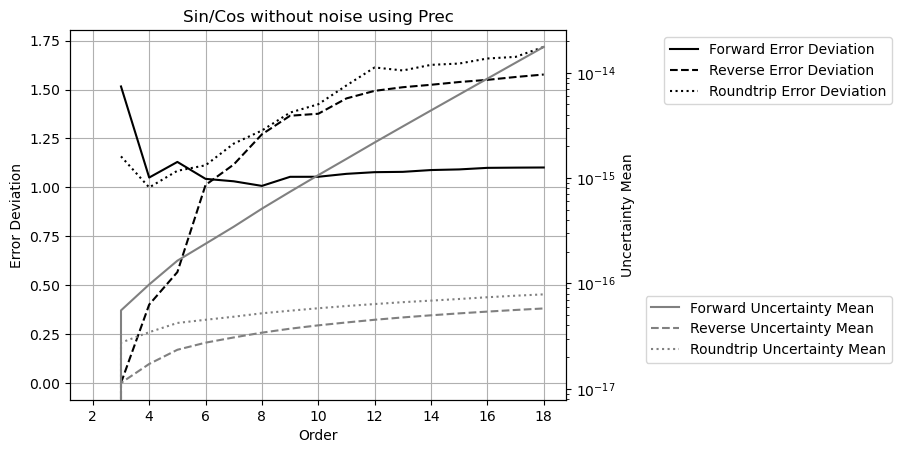

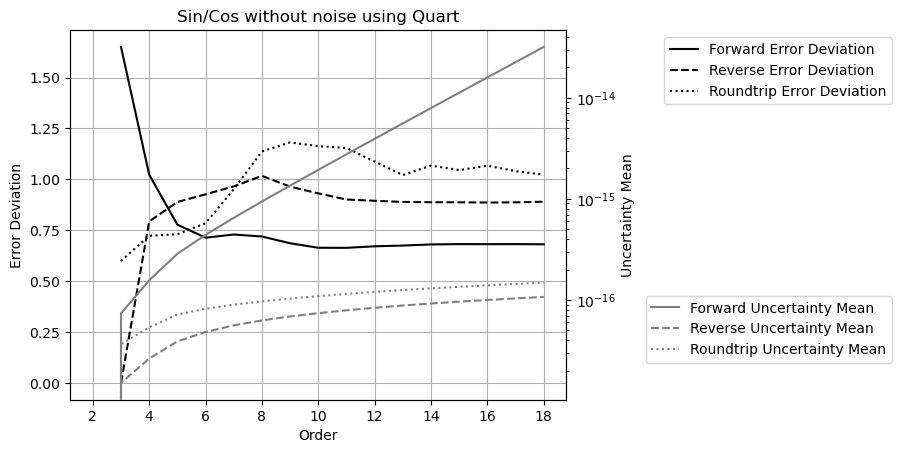

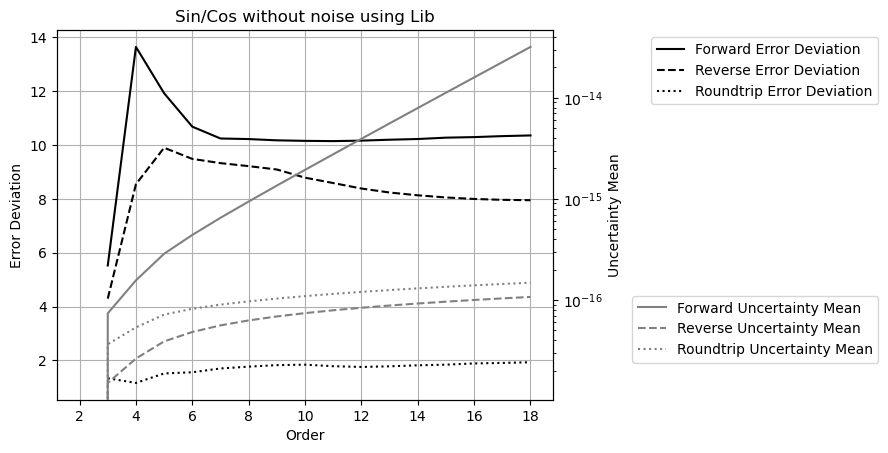

In [47]:
for lib in ('Prec', 'Quart', 'Lib'):
    PlotVsOrder(lib, 'Aggr', noise=0)

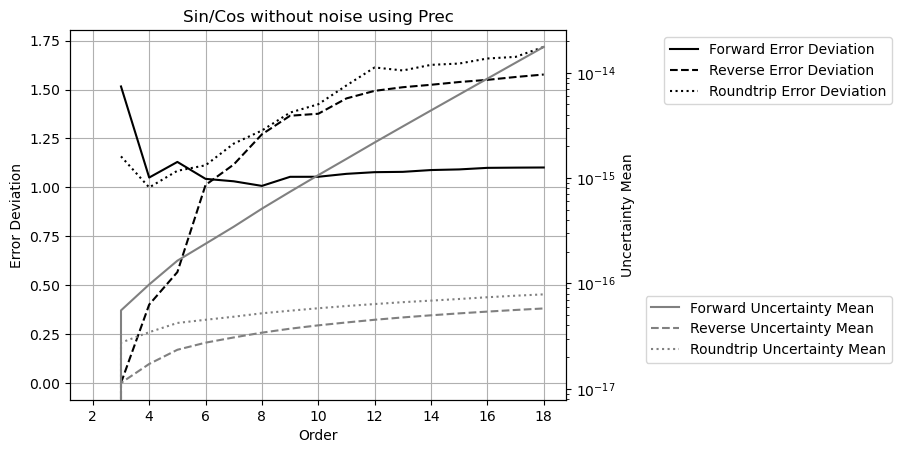

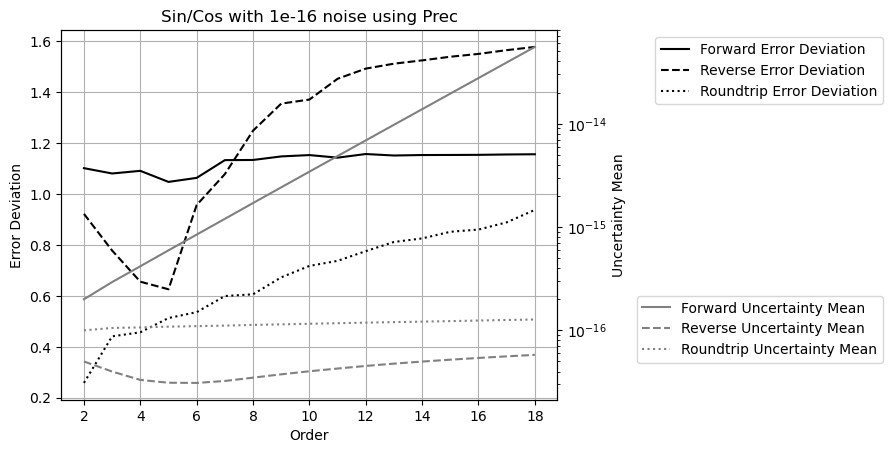

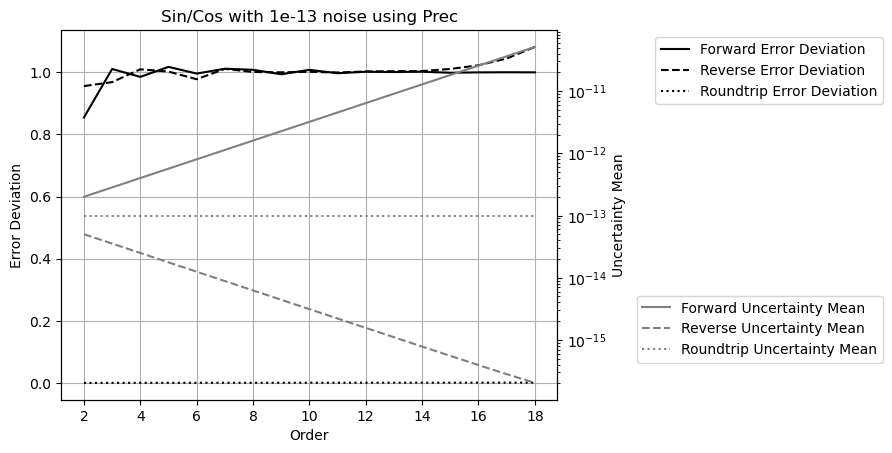

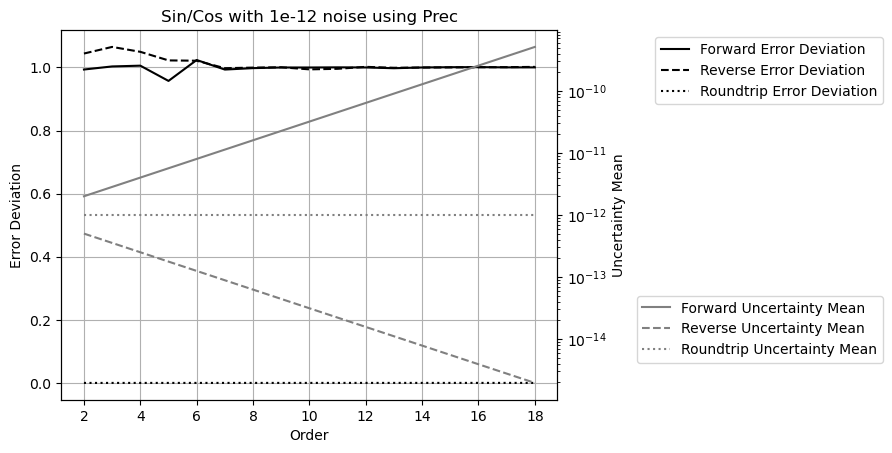

In [48]:
for noise in (0, 1e-16, 1e-13, 1e-12):
    PlotVsOrder('Prec', 'Aggr', noise=noise)

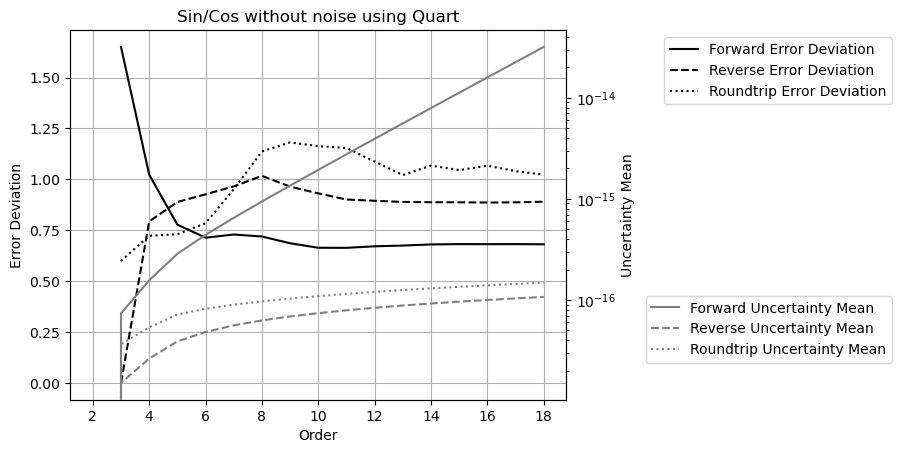

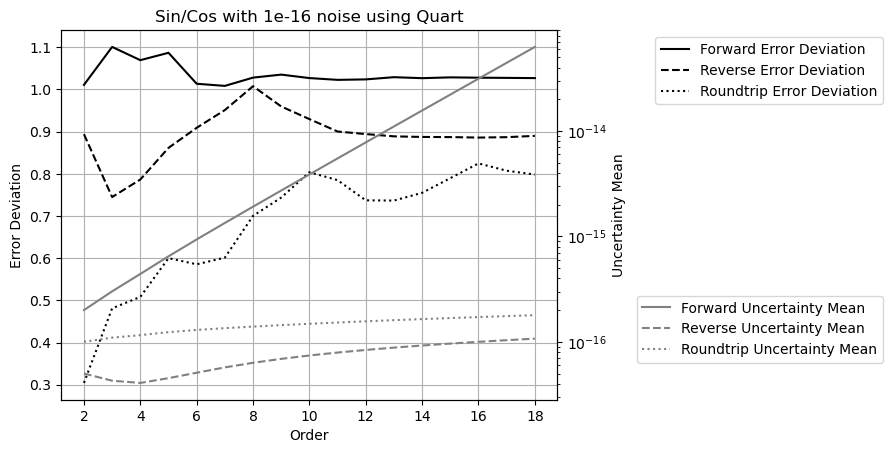

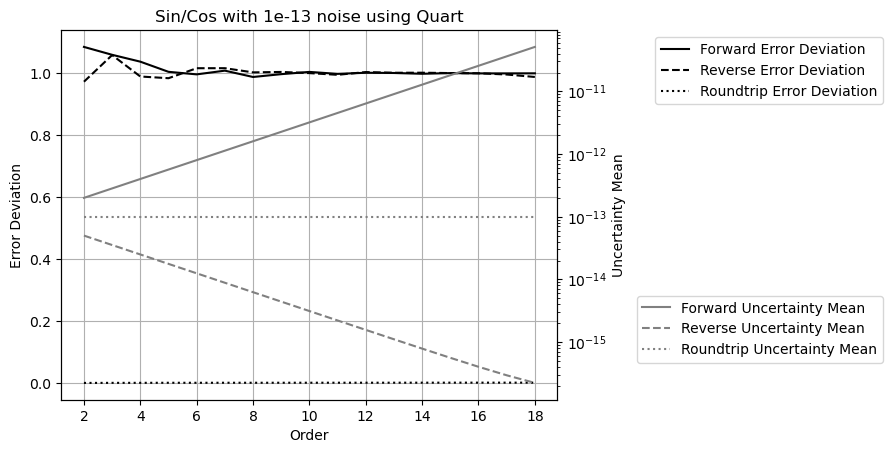

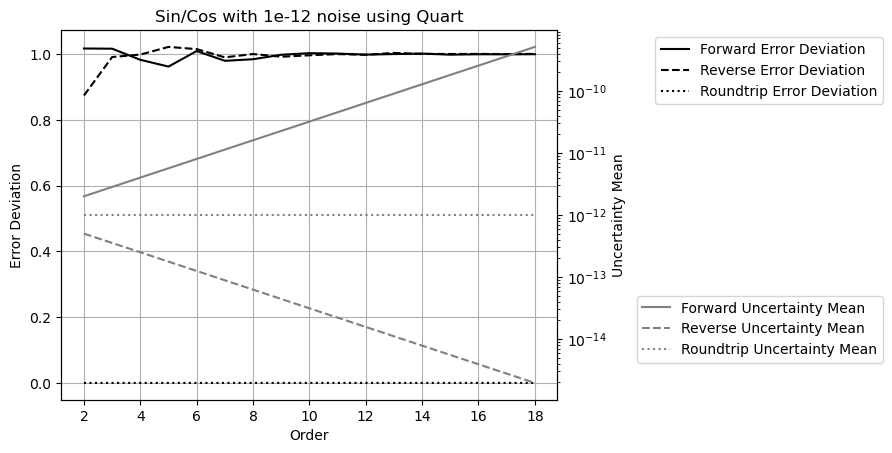

In [49]:
for noise in (0, 1e-16, 1e-13, 1e-12):
    PlotVsOrder('Quart', 'Aggr', noise=noise)

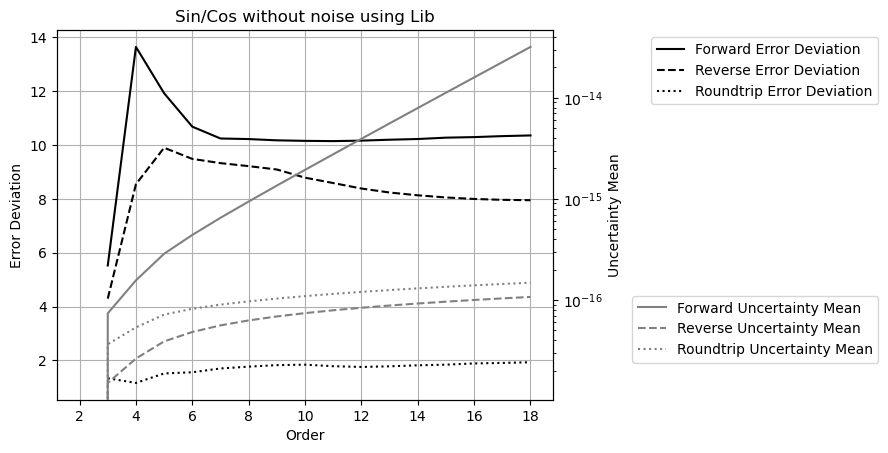

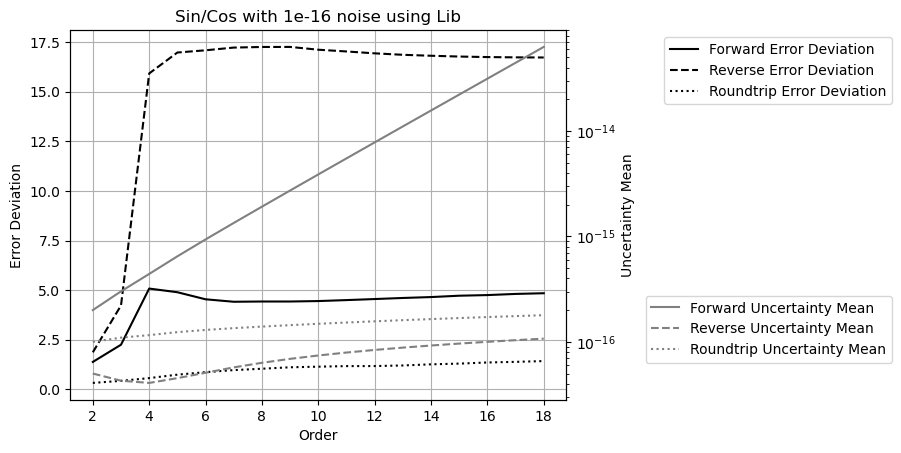

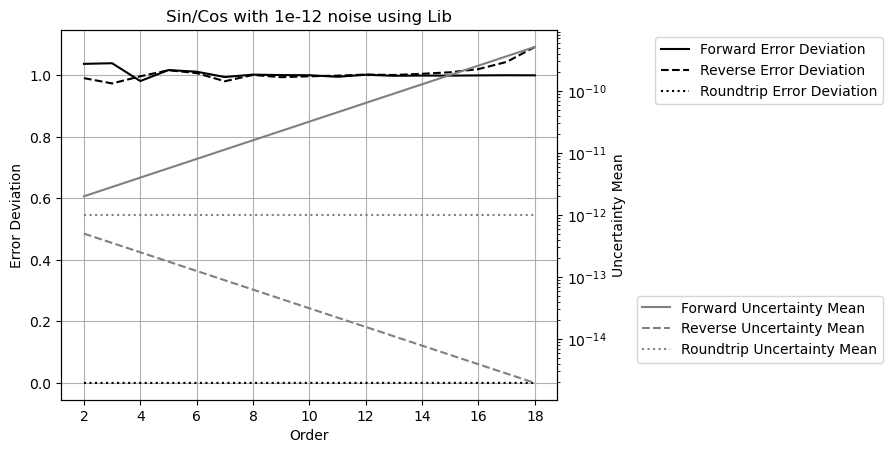

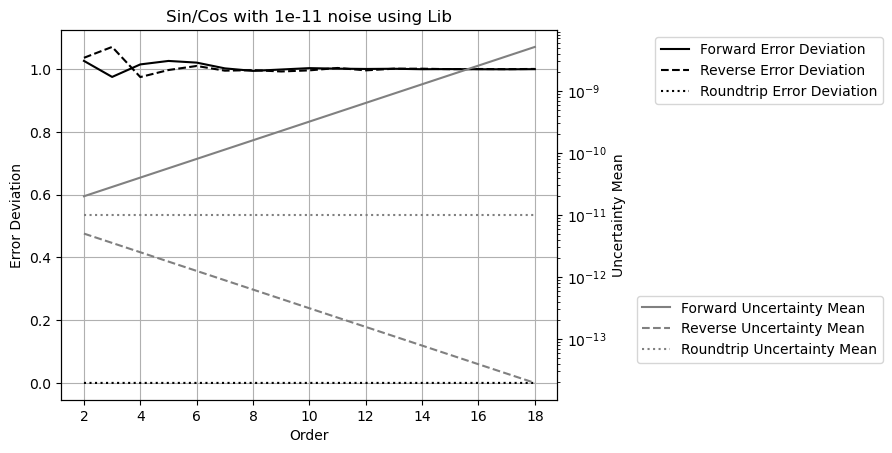

In [50]:
for noise in (0, 1e-16, 1e-12, 1e-11):
    PlotVsOrder('Lib', 'Aggr', noise=noise)

## Linear

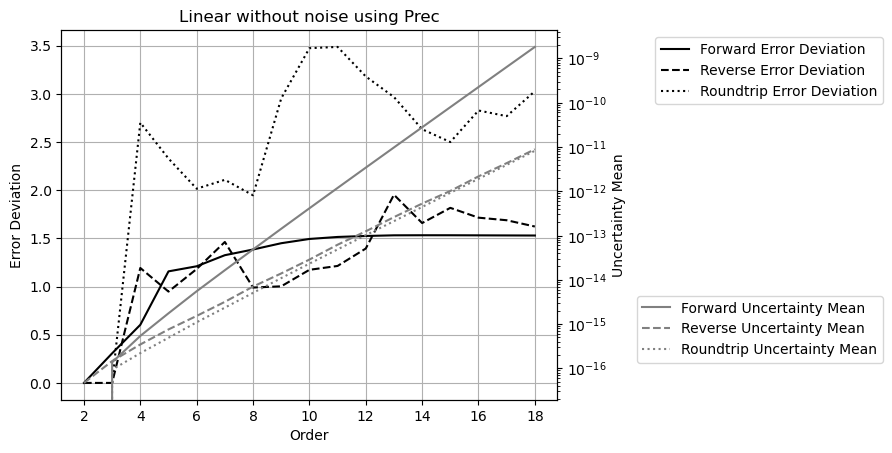

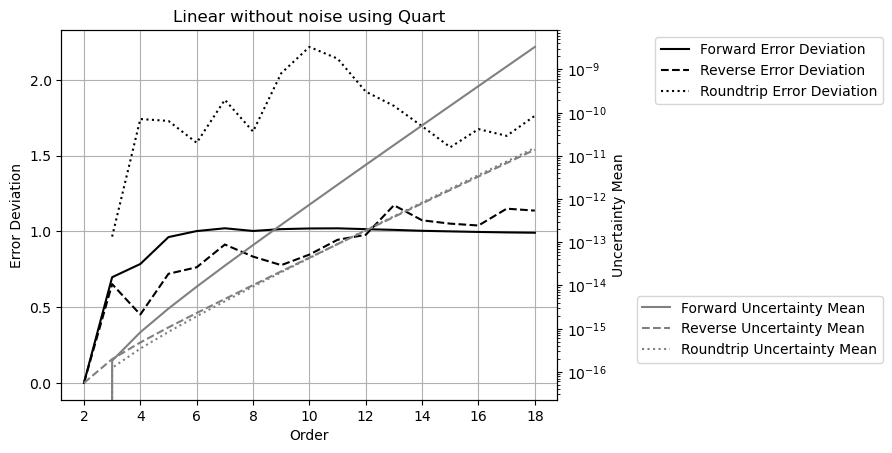

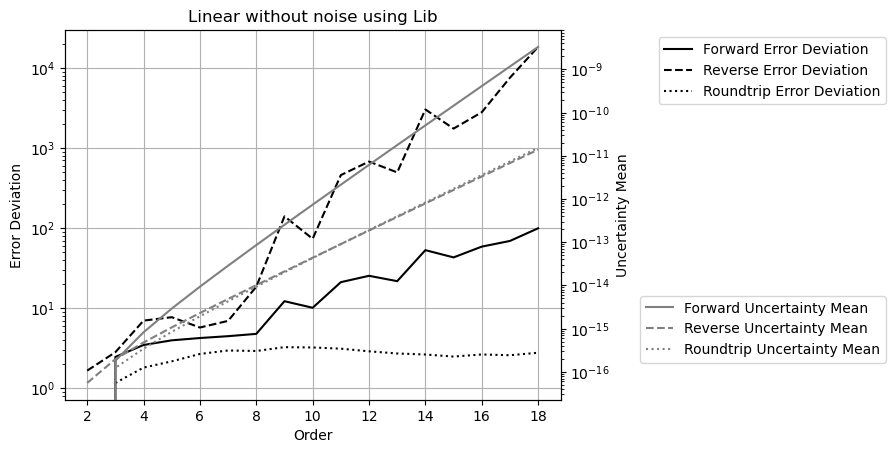

In [51]:
for lib in ('Prec', 'Quart', 'Lib'):
    PlotVsOrder(lib, 'Linear', noise=0, sLogy=(lib == 'Lib', True))

In [52]:
dfF = df[(df['SinSource']=='Lib') & (df['NoiseType']=='Gaussian') & (df['Noise']==0)
          & (df['Signal']=='Linear') & (df['Freq']==0) & (df['Test']=='Reverse')]
dfF[['SinSource', 'NoiseType', 'Noise', 'Signal', 'Order', 'Freq', 'Test',
     'Error Count', 'Error Mean', 'Error Deviation', 'Error Minimum', 'Error Minimum At', 'Error Maximum', 'Error Maximum At']]

,SinSource,NoiseType,Noise,Signal,Order,Freq,Test,Error Count,Error Mean,Error Deviation,Error Minimum,Error Minimum At,Error Maximum,Error Maximum At
463,Lib,Gaussian,0.0,Linear,2,0,Reverse,4,-0.275758,1.663752,-2.551520,1.0,1.448490,5.0
1615,Lib,Gaussian,0.0,Linear,3,0,Reverse,14,0.268639,2.825714,-3.819865,1.0,3.654550,13.0
3919,Lib,Gaussian,0.0,Linear,4,0,Reverse,30,0.252958,7.001859,-10.400989,1.0,9.724355,8.0
6655,Lib,Gaussian,0.0,Linear,5,0,Reverse,62,0.263933,7.723624,-15.326215,3.0,11.974097,47.0
9391,Lib,Gaussian,0.0,Linear,6,0,Reverse,126,0.076455,5.742550,-11.458879,61.0,12.828642,111.0
12127,Lib,Gaussian,0.0,Linear,7,0,Reverse,254,0.118323,6.949695,-17.090047,238.0,14.860773,94.0
14863,Lib,Gaussian,0.0,Linear,8,0,Reverse,510,0.175774,18.541544,-36.881328,1.0,31.734265,96.0
17599,Lib,Gaussian,0.0,Linear,9,0,Reverse,1022,0.207322,140.179275,-257.672304,17.0,229.234180,529.0
20335,Lib,Gaussian,0.0,Linear,10,0,Reverse,2046,2.090979,73.503893,-163.838238,1.0,215.859942,1537.0
23071,Lib,Gaussian,0.0,Linear,11,0,Reverse,4094,-0.244213,458.648694,-862.802144,65.0,785.364669,2305.0


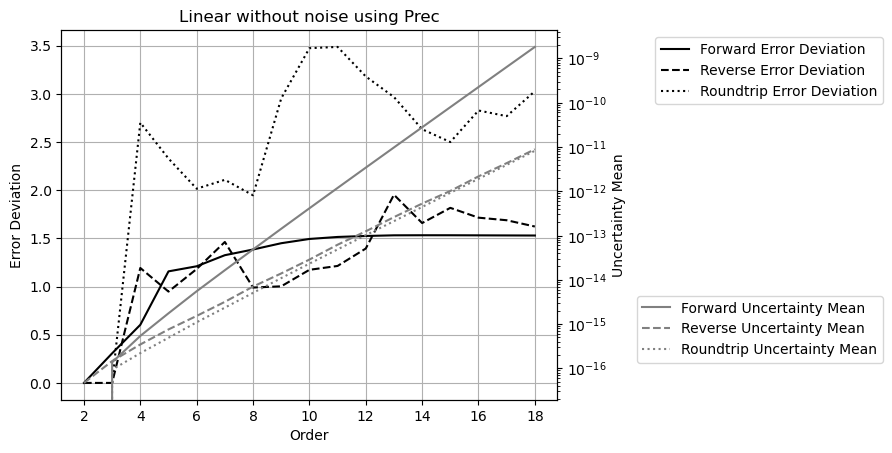

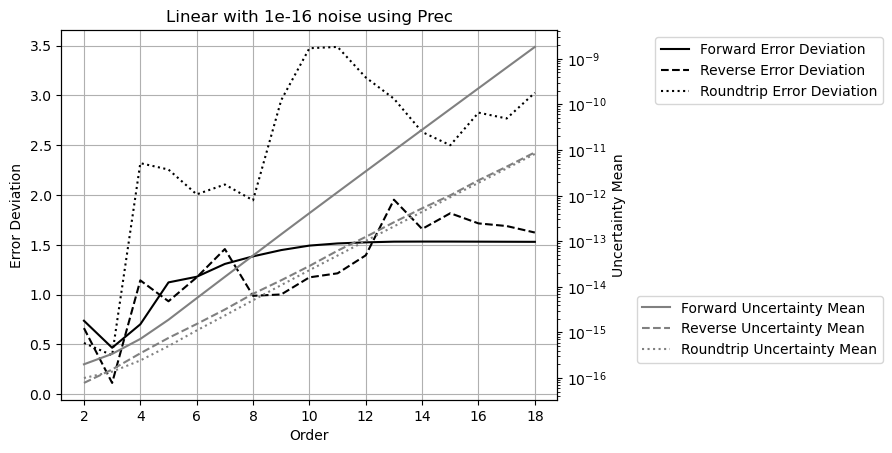

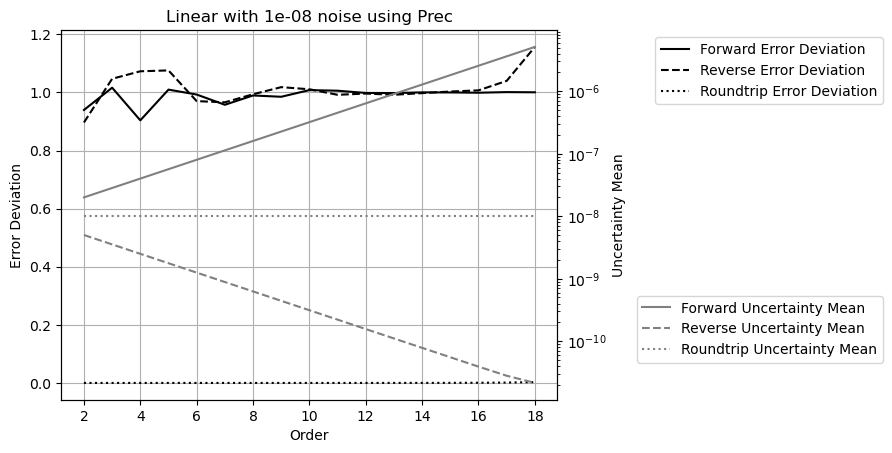

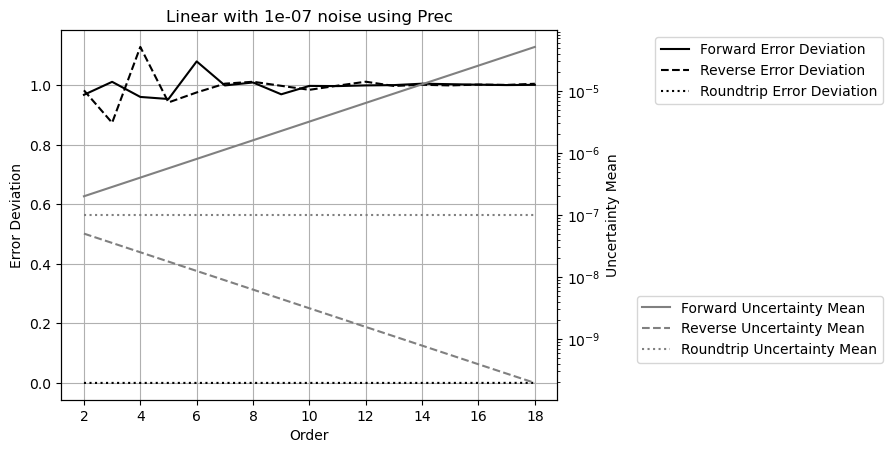

In [53]:
for noise in (0, 1e-16, 1e-8, 1e-7):
    PlotVsOrder('Prec', 'Linear', noise=noise)

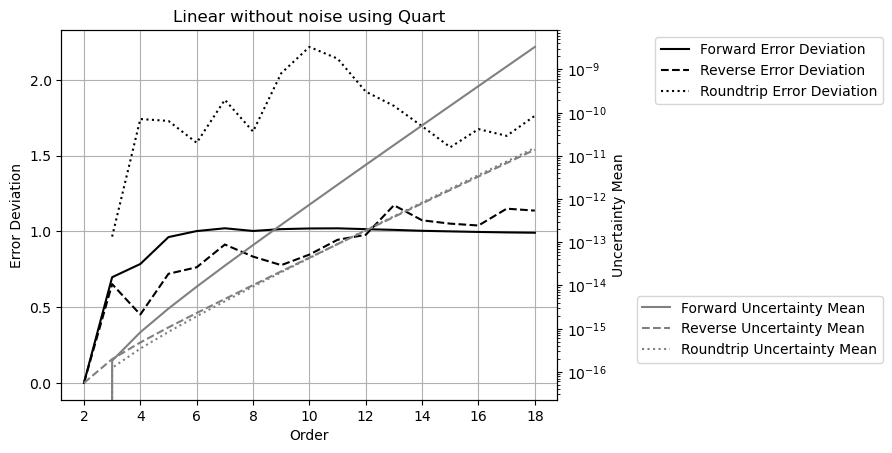

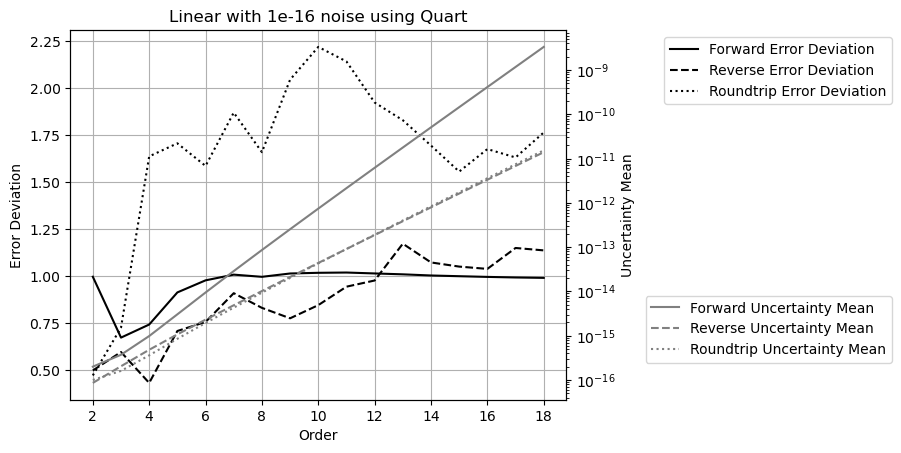

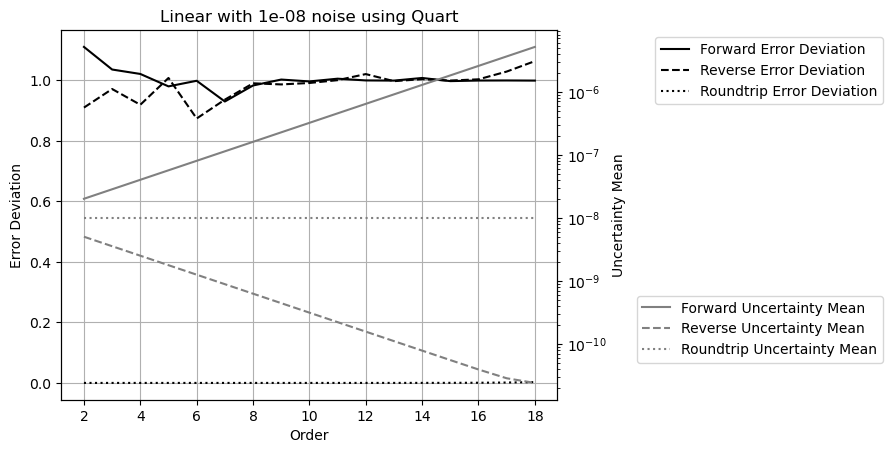

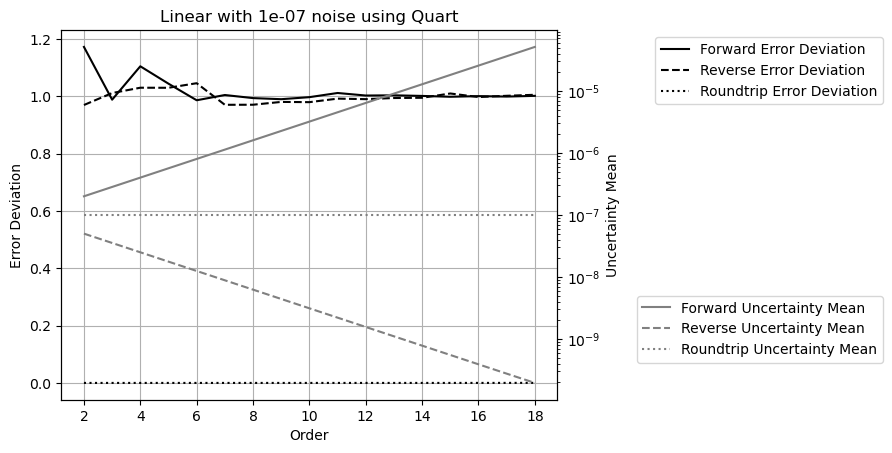

In [54]:
for noise in (0, 1e-16, 1e-8, 1e-7):
    PlotVsOrder('Quart', 'Linear', noise=noise)

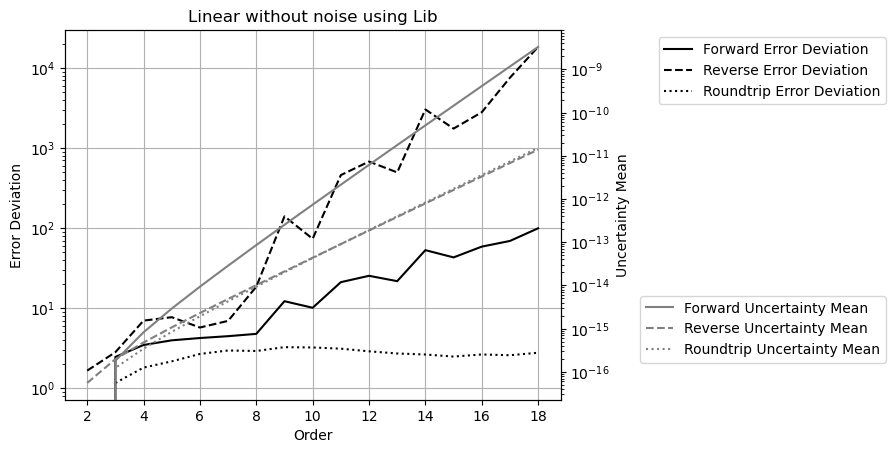

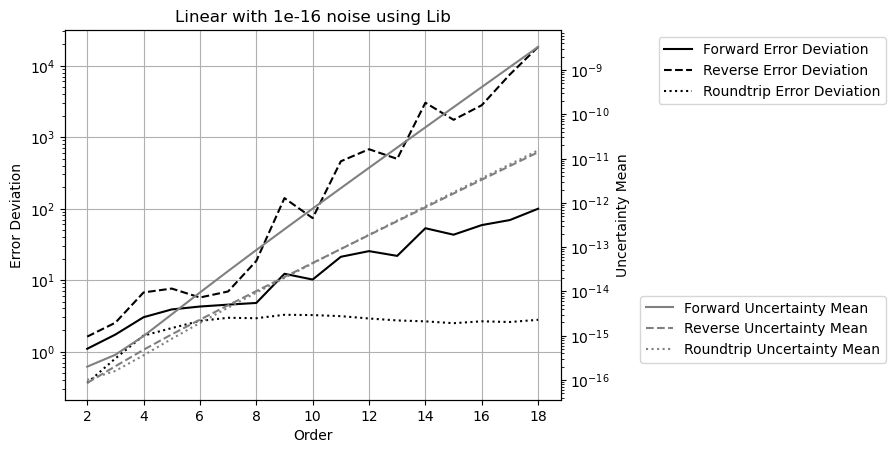

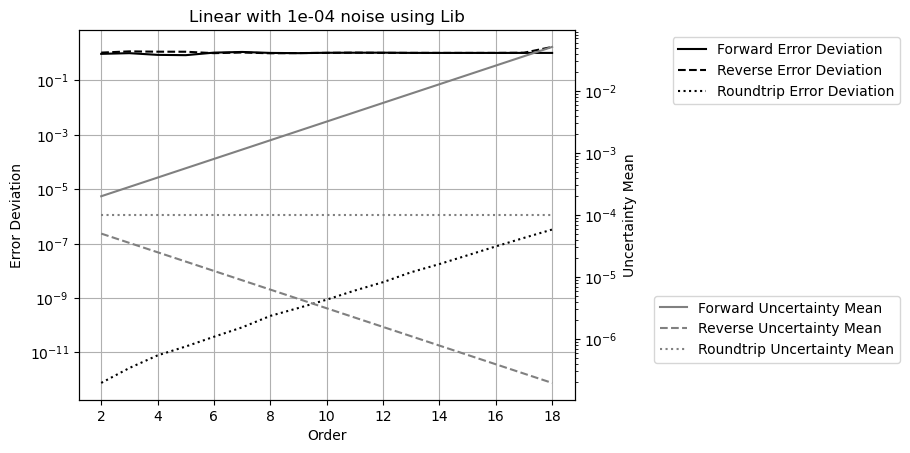

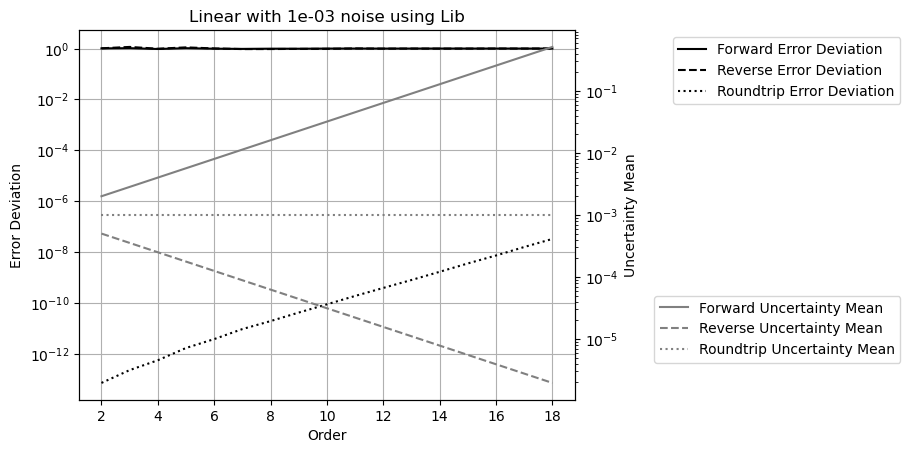

In [55]:
for noise in (0, 1e-16, 1e-4, 1e-3):
    PlotVsOrder('Lib', 'Linear', noise=noise, sLogy=(True, True))

# vs Noise

In [56]:
def PlotVsNoise( sinSource, signal, freq=0, sTest=('Forward', 'Reverse', 'Roundtrip'), 
                 sValue=('Error Deviation', 'Uncertainty Mean'), 
                 sStyle=('-', '--', ':'), sLogy=(False, True), sColor = ('black','gray'), 
                 noiseType='Gaussian', order=ORDER ):
    
    fig, ax = plt.subplots()
    signalName = 'Sin/Cos' if signal=='Aggr' else signal if signal=='Linear' else f'{signal} freq={freq}'
    ax.set_title(f'{signalName} vs noise using {sinSource}')
    ax.set_xlabel('Noise')
    ax.set_xscale('log')
    ax.set_ylabel(sValue[0])
    if sLogy[0]:
        ax.set_yscale('log')
    plt.grid(True)
    
    ax2 = ax.twinx()
    ax2.set_ylabel(sValue[1])
    if sLogy[1]:
        ax2.set_yscale('log')
    
    for test, style in zip(sTest, sStyle):
        dfPlot = df[(df['SinSource']==sinSource) & (df['Signal']==signal) & (df['Freq']==freq) & (df['Test']==test) &
                    (df['NoiseType']==noiseType) & (df['Noise']!=0) & (df['Order']==order)]
        if dfPlot.empty:
            continue
        ax.plot(dfPlot['Noise'], dfPlot[sValue[0]], ls=style, c=sColor[0], label=f'{test} {sValue[0]}')
        ax2.plot(dfPlot['Noise'], dfPlot[sValue[1]], ls=style, c=sColor[1], label=f'{test} {sValue[1]}')

    ax.legend(bbox_to_anchor=(1.65, 1.0))
    ax2.legend(bbox_to_anchor=(1.65, 0.3))

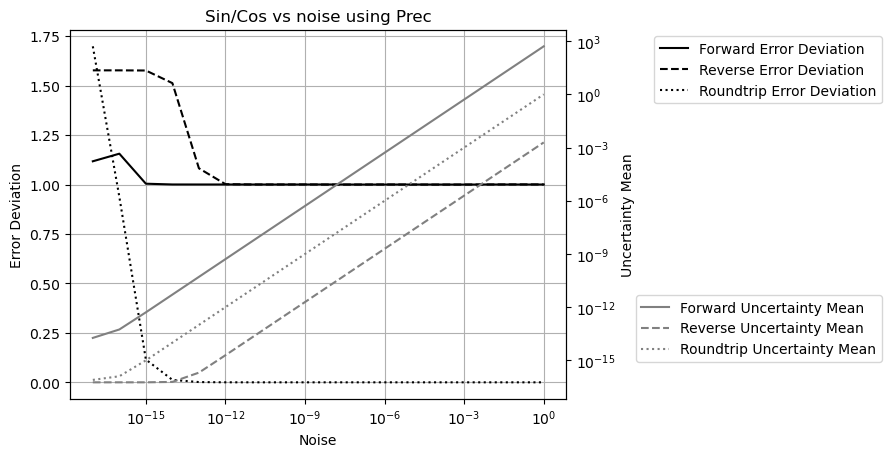

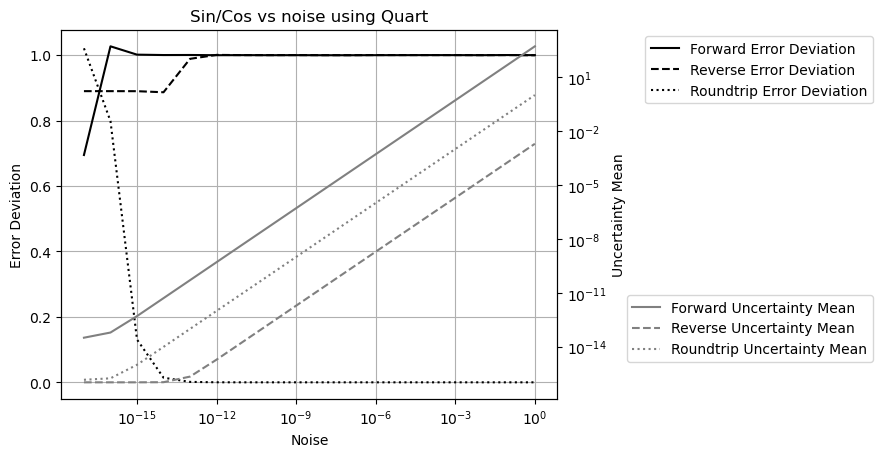

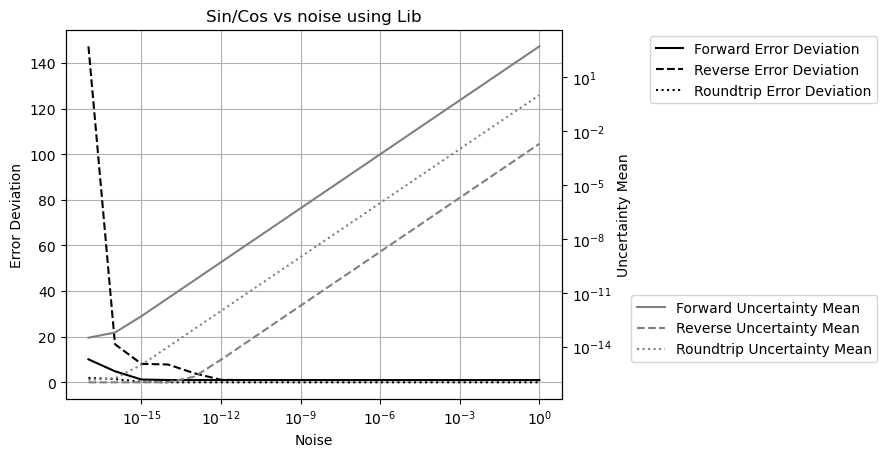

In [57]:
for sinSource in ('Prec', 'Quart', 'Lib'):
    PlotVsNoise(sinSource, 'Aggr')

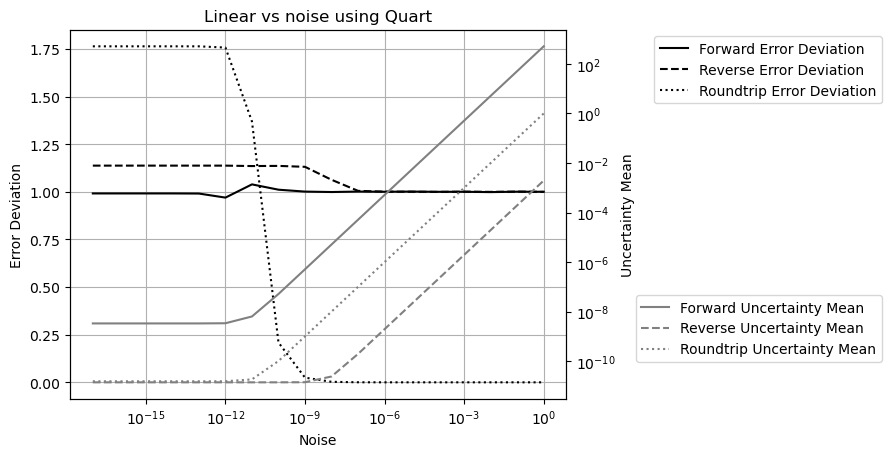

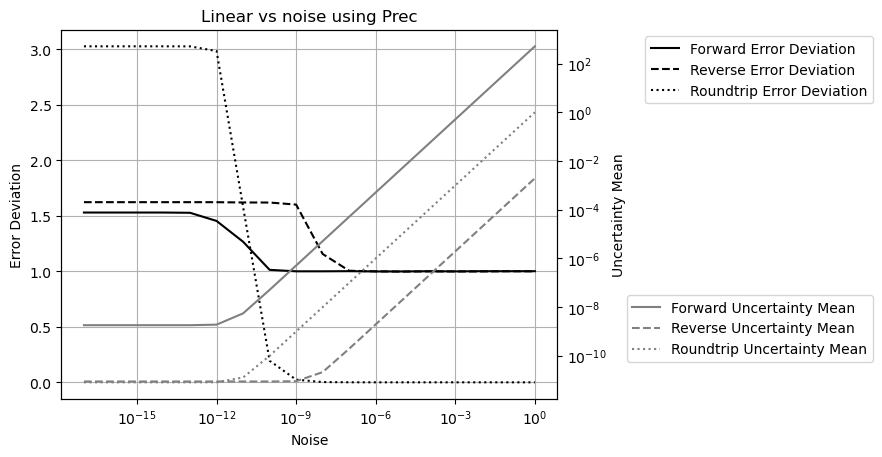

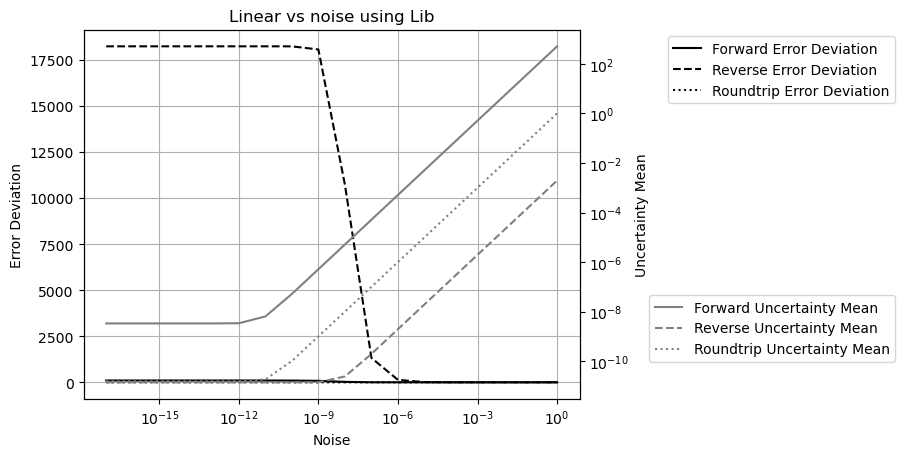

In [58]:
for sinSource in ('Quart', 'Prec', 'Lib'):
    PlotVsNoise(sinSource, 'Linear')

# Lib Error Resonance

In [59]:
def PlotResonant(test, signal, value='Error Deviation', sinSource='Lib', logz=False, cmap=plt.cm.gray, minOrder=4,
                zlabel=''):
    dfOrderVsFreq = df[(df['Noise']==0) & (df['NoiseType']=='Gaussian') & 
                       (df['Order']>=minOrder) & (df['Order']<=ORDER) & 
                       (df['SinSource']==sinSource) & (df['Signal']==signal) & (df['Test']==test)]\
                .pivot(index='Freq', columns='Order', values=value)
    sOrder = dfOrderVsFreq.columns.values
    SFreq = dfOrderVsFreq.index.values
    sX, sY = np.meshgrid(sOrder, SFreq)
    #sY = np.log10(sY)
    sZ = np.log10(dfOrderVsFreq.values) if logz else dfOrderVsFreq.values
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(30, 135)
    surf = ax.plot_surface( sX, sY, sZ, cmap=cmap if cmap else plt.cm.spring if value == 'Uncertainty Mean' else plt.cm.winter )
    cb = fig.colorbar(surf, shrink=0.5, aspect=5, pad=0.15)
    
    ax.set_title(f'{signal} {test} using Library sine')
    
    ax.set_xlabel('Order')
    sXTick = [sOrder[i] for i in range(0, len(sOrder), 2)]
    ax.set_xticks(sXTick, [f'{x}' for x in sXTick])
    
    ax.set_ylabel('Frequence')
    sYTick = [SFreq[i] for i in range(0, len(SFreq), 3)]
    ax.set_yticks(sYTick)
    
    if zlabel:
        ax.set_zlabel(zlabel)
    else:
        ax.set_zlabel(value)
    if value == 'Error Deviation':
        pass
        # TODO: adjust color range 
        # ax.set_zlim([0, 2])
        # cb.set_clim([0, 2])
    if logz:
        zMin = int(math.floor(np.min(sZ)))
        zMax = int(math.ceil(np.max(sZ)))
        sZTick = range(zMin, zMax, int(math.ceil((zMax - zMin)/10)))
        ax.set_zticks(sZTick, [f'1e{z:+}' for z in sZTick])

## Uncertainty Mean

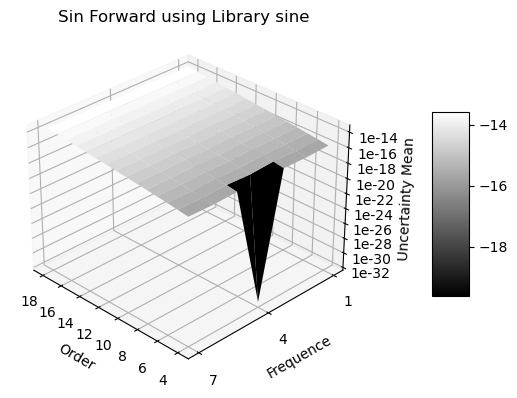

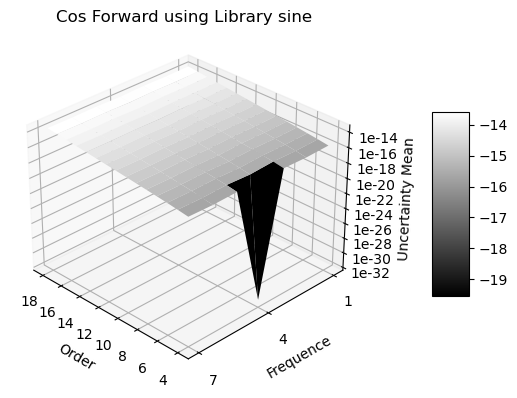

In [60]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Forward', signal, value='Uncertainty Mean', logz=True)

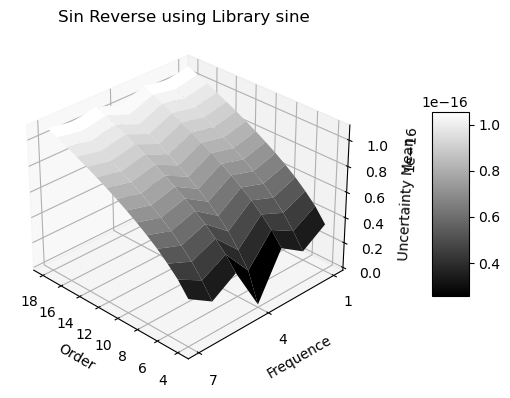

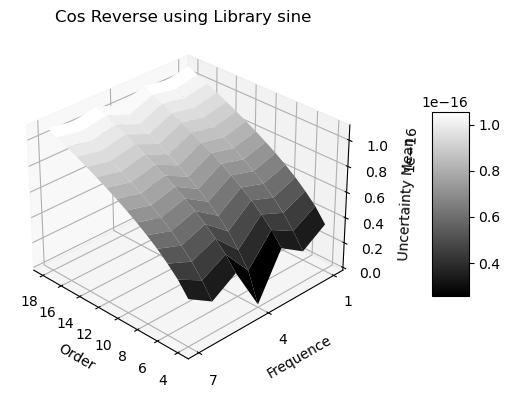

In [61]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Reverse', signal, value='Uncertainty Mean')

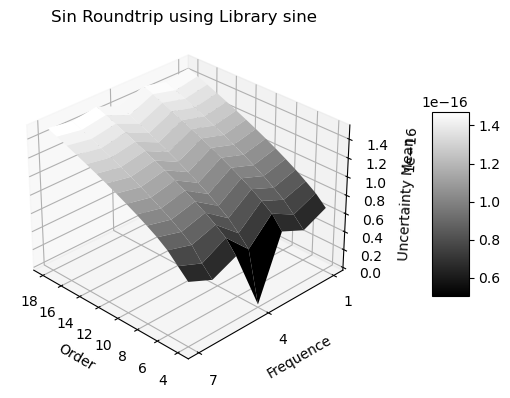

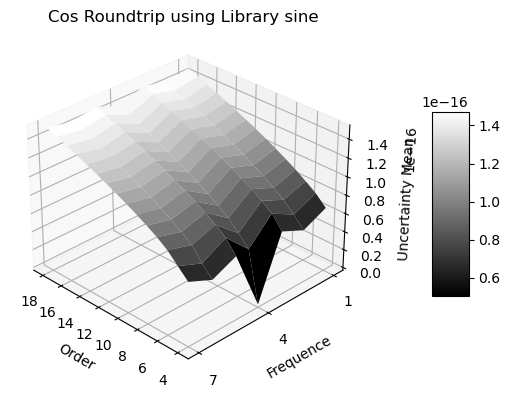

In [62]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Roundtrip', signal, value='Uncertainty Mean')

## Error Deviation

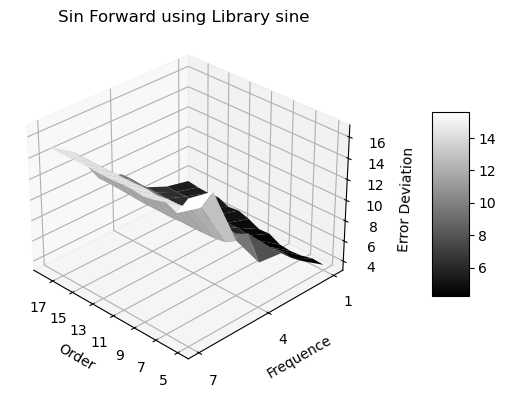

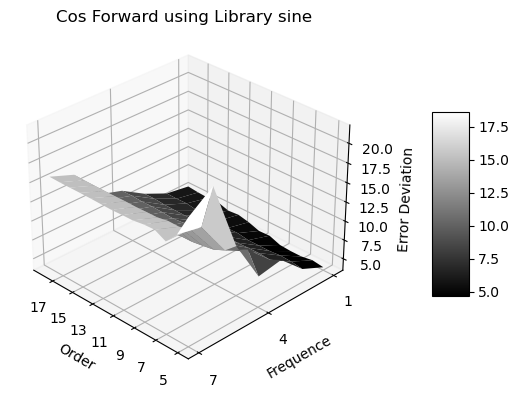

In [63]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Forward', signal, minOrder=5)

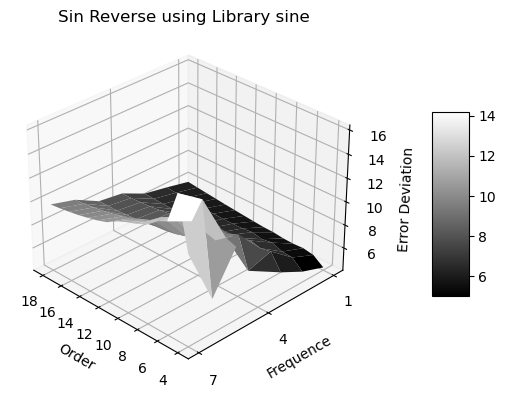

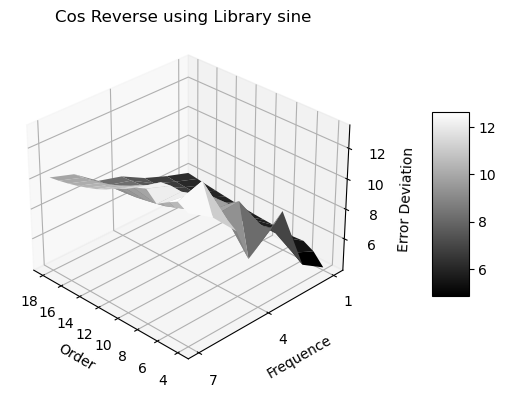

In [64]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Reverse', signal)

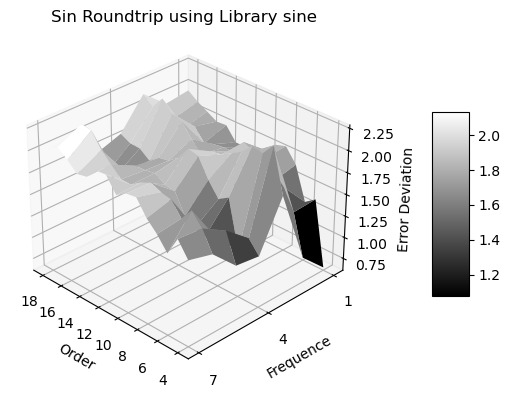

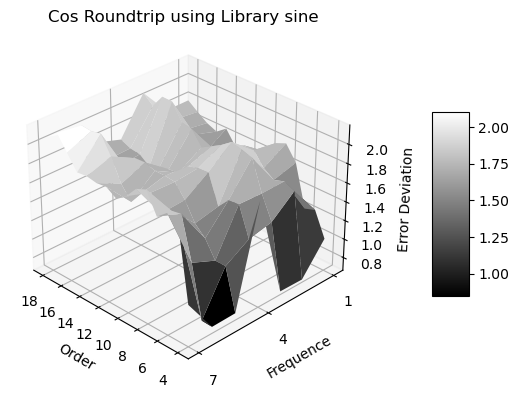

In [65]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Roundtrip', signal)

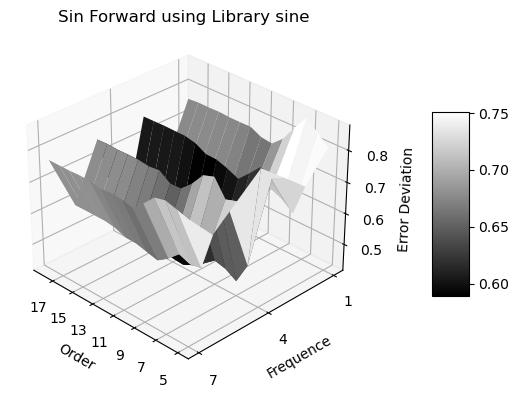

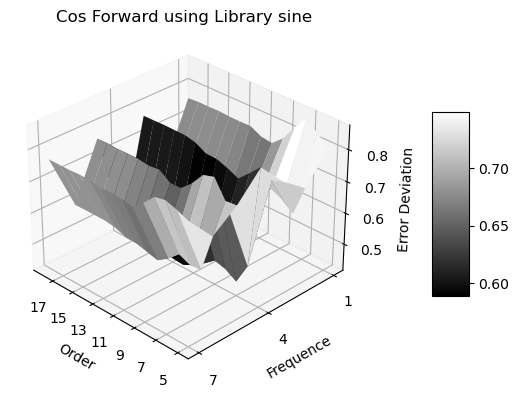

In [66]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Forward', signal, minOrder=5, sinSource='Quart')

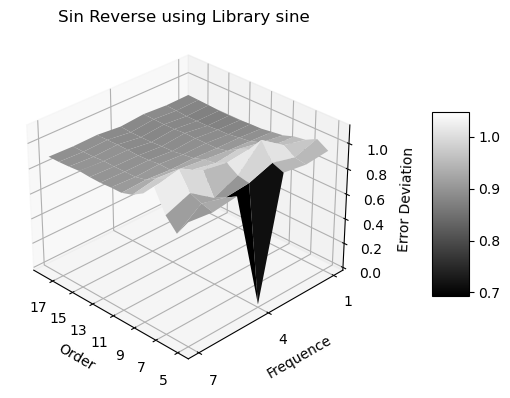

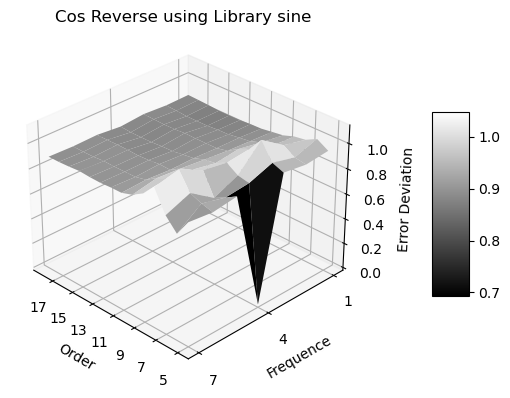

In [67]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Reverse', signal, minOrder=5, sinSource='Quart')

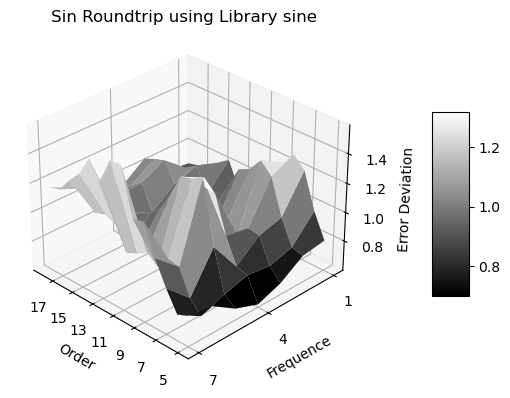

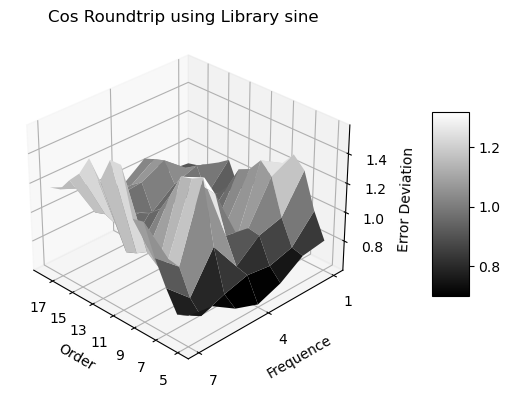

In [68]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Roundtrip', signal, minOrder=5, sinSource='Quart')

## Value Error Deviation

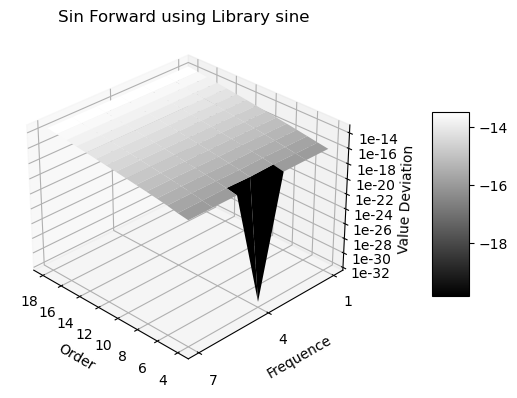

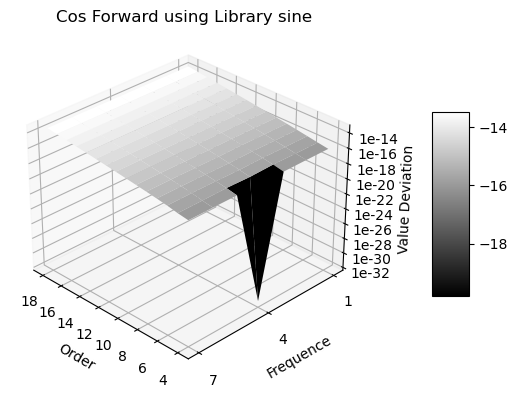

In [69]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Forward', signal, value='Value Deviation', logz=True)

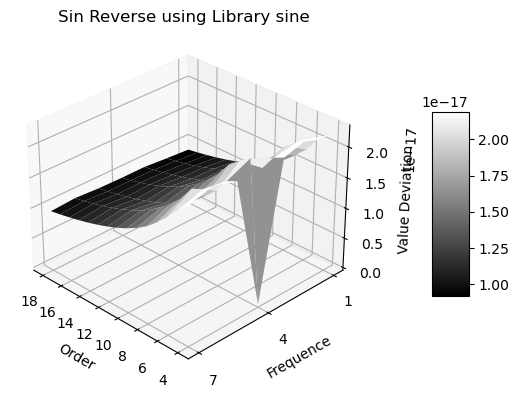

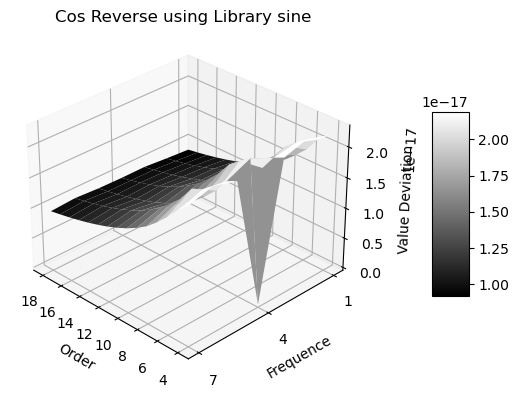

In [70]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Reverse', signal, value='Value Deviation')

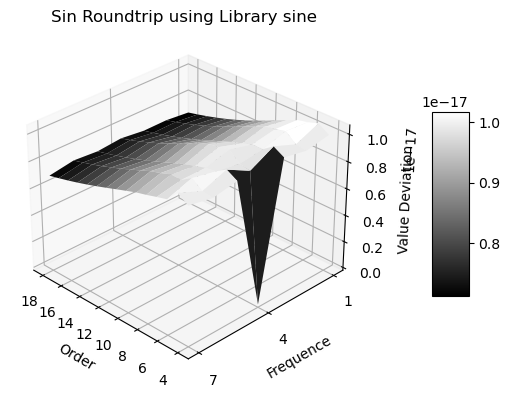

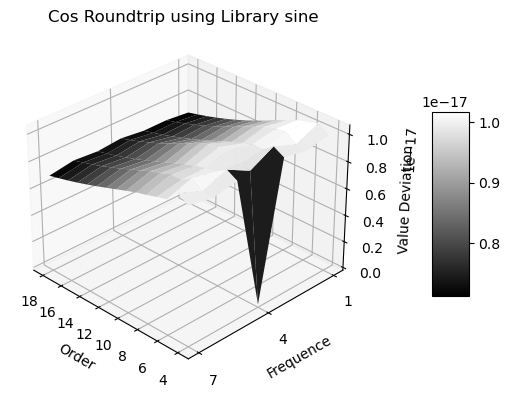

In [71]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Roundtrip', signal, value='Value Deviation')

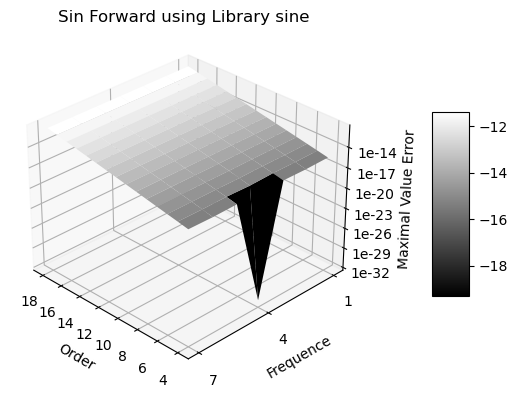

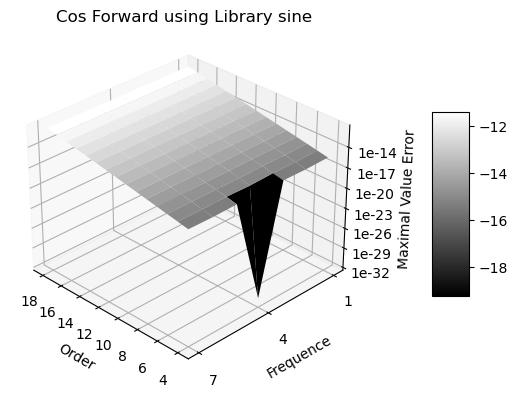

In [72]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Forward', signal, value='Value Maximum', zlabel='Maximal Value Error', logz=True)

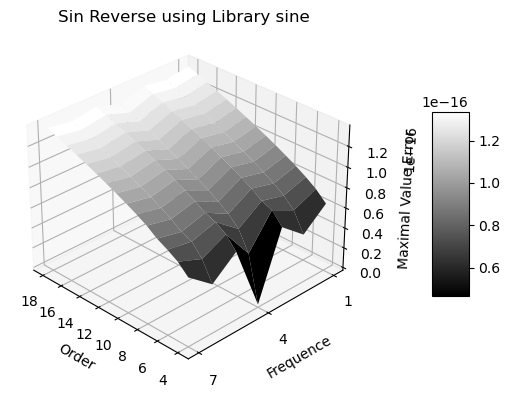

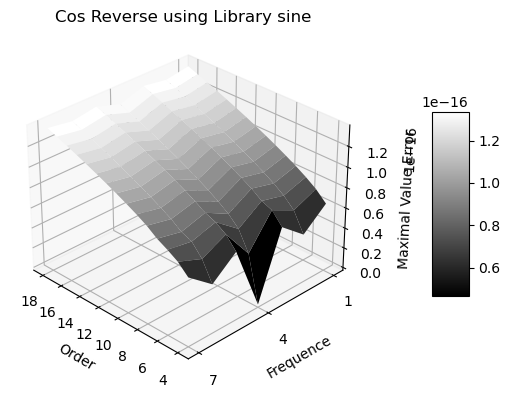

In [73]:
for signal in ('Sin', 'Cos'):
    PlotResonant('Reverse', signal, value='Value Maximum', zlabel='Maximal Value Error')